In [83]:
import scipy

import jax
import jax.numpy as jnp
import numpy as np
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow_probability.substrates.jax as tfp
from toolz import partial, valmap
from tqdm.auto import tqdm
from aging.plotting import figure, format_plots, add_identity
from aging.behavior.bio_age_model import (
    age_normalizer_factory,
    neg_log_likelihood,
    create_splines,
    optimize,
    get_biological_age,
    piecewise_linear_bases,
)
from sklearn.model_selection import RepeatedStratifiedKFold, ShuffleSplit, StratifiedShuffleSplit

In [2]:
warnings.simplefilter("ignore")

In [3]:
format_plots()

In [4]:
df = pd.read_parquet(
    "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_relabeled_counts_matrix_v00.parquet"
)
df = df.sort_index(axis=1)

n_syllables = 30
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))[:, :n_syllables]

In [5]:
# plt.imshow(df.astype(float), aspect='auto', cmap='viridis', vmax=300)
# plt.colorbar()

In [17]:
age_normalizer, age_unnormalizer = age_normalizer_factory(
    min_age=1, max_age=130, log_transform=True
)

In [18]:
age_samples = np.linspace(0, 1, 1000)
n_splines = 6
spline_class, splines = create_splines(age_samples, df=n_splines)
age_sd = age_normalizer(10)
hypparams = {
    'age_sd': age_sd,
    'params_sd': 1,
}
scale = 0.2

A = spline_class.transform(age_normalizer(age)).T
# theta, *_ = np.linalg.lstsq(A.T, (syllable_counts_jax + 1) * scale, rcond=None)

theta_list = []
for i in range(n_syllables):
    _theta, _ = scipy.optimize.nnls(A.T, (syllable_counts_jax + 1)[:, i] * scale)
    theta_list.append(_theta)
theta_list = np.array(theta_list).T
theta_list = np.where(theta_list == 0, 1e-3, theta_list)
params = {'basis_weights': jnp.log(jnp.array(theta_list.T))}

In [19]:
age_samples = np.linspace(0, 1, 1000)
age_sd = age_normalizer(10)
hypparams = {
    'age_sd': age_sd,
    'params_sd': 1,
}


def fit_params(counts, n_splines, age):
    spline_class, splines = create_splines(age_samples, df=n_splines)
    scale = 0.2

    A = spline_class.transform(age_normalizer(age)).T

    theta_list = []
    for i in range(n_syllables):
        _theta, _ = scipy.optimize.nnls(A.T, (counts + 1)[:, i] * scale)
        theta_list.append(_theta)
    theta_list = np.array(theta_list).T
    theta_list = np.where(theta_list == 0, 1e-3, theta_list)
    params = {'basis_weights': jnp.log(jnp.array(theta_list.T))}
    return params

In [20]:
preds = splines.T @ theta_list

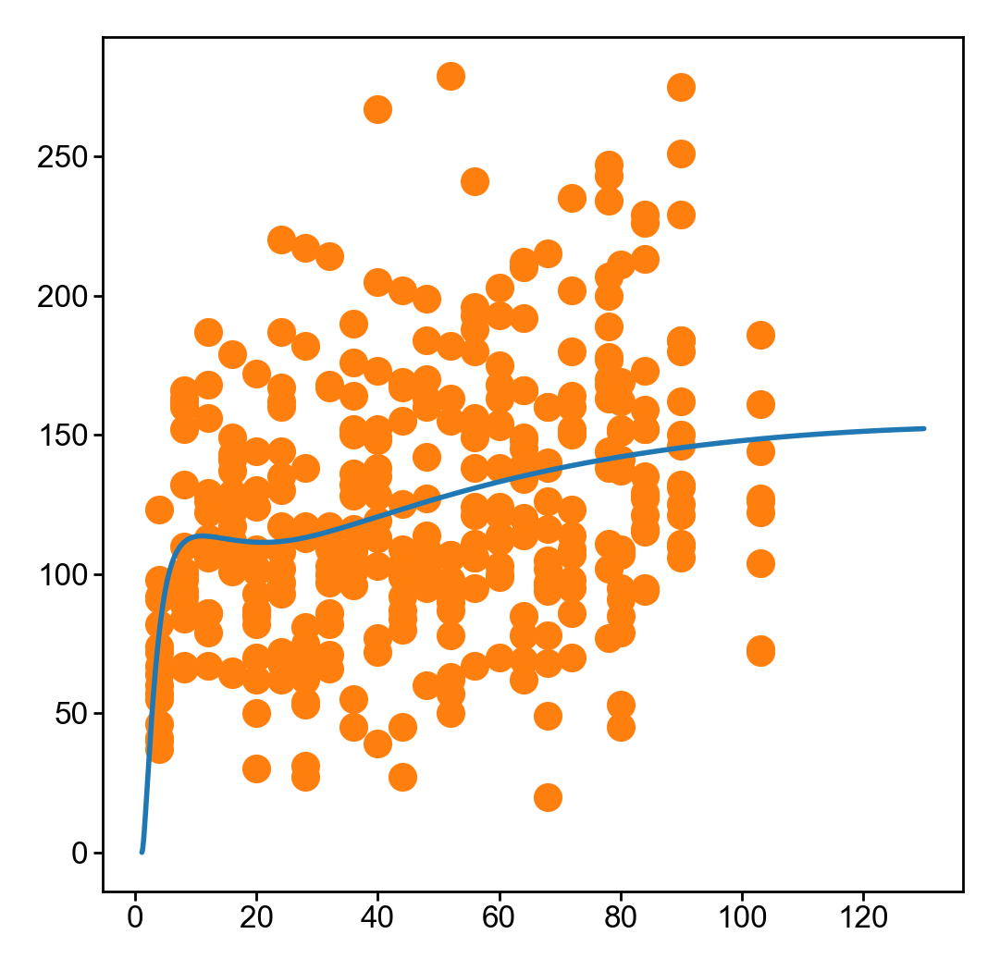

In [21]:
syllable = 3
plt.plot(age_unnormalizer(age_samples), preds[:, syllable] * (1 / scale))
plt.scatter(age, syllable_counts_jax[:, syllable], c='C1')

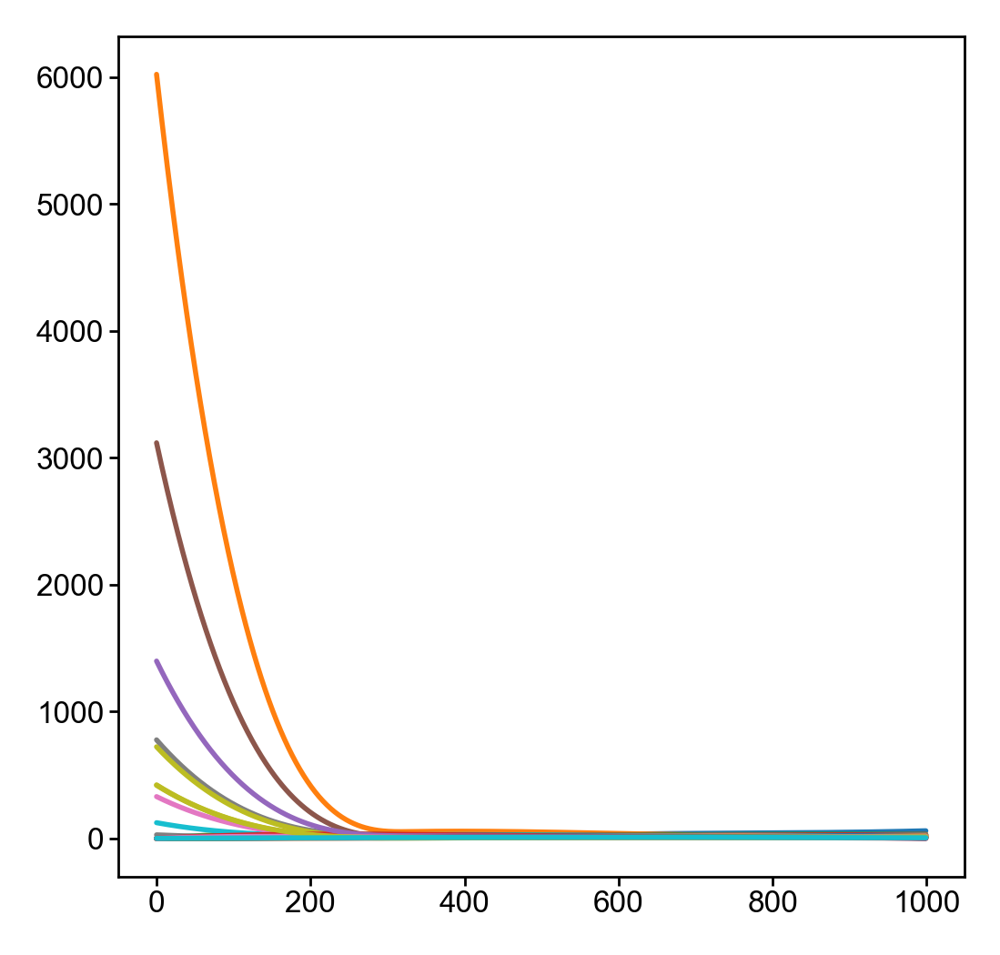

In [22]:
plt.plot(splines.T @ theta_list);

## Run held-out fitting to determine number of splines

In [81]:
use_log_age = False
age_normalizer, age_unnormalizer = age_normalizer_factory(
    min_age=1, max_age=130, log_transform=use_log_age
)
age_samples = np.linspace(0, 1, 1000)
age_sd = age_normalizer(3)

hypparams = {
    "age_sd": age_sd,
    "params_sd": 1,
}

pbar = tqdm(range(4, 28, 3))

out_ll = {}

for n_splines in pbar:
    # fold = RepeatedStratifiedKFold(n_splits=3, n_repeats=6, random_state=0)
    # fold = ShuffleSplit(n_splits=5, test_size=0.3, random_state=0)
    fold = StratifiedShuffleSplit(n_splits=4, test_size=0.5, random_state=0)
    spline_class, splines = create_splines(age_samples, df=n_splines)
    
    # splines = piecewise_linear_bases(age_samples, jnp.linspace(0, 1, n_splines + 2)[1:-1])

    params = fit_params(syllable_counts_jax, n_splines, age)

    lls = []
    for i, (train_index, test_index) in enumerate(fold.split(age, age)):
        ll_fun = partial(
            neg_log_likelihood,
            bases=splines,
            age_samples=age_samples,
            true_age=age_normalizer(age[train_index]),
            counts=syllable_counts_jax[train_index] + 1,
            hypparams=hypparams,
        )
        optimized_params, loss = optimize(params, ll_fun, lr=0.15, n_iter=50)

        heldout_nll = neg_log_likelihood(
            optimized_params,
            splines,
            age_samples,
            age_normalizer(age[test_index]),
            syllable_counts_jax[test_index] + 1,
            hypparams=hypparams,
            heldout=True,
        )
        out_ll[(n_splines, i)] = -heldout_nll
        lls.append(-heldout_nll)
        print("n_splines", n_splines, "sd", hypparams["params_sd"], "ll", -heldout_nll)

  0%|          | 0/8 [00:00<?, ?it/s]

n_splines 4 sd 1 ll -122231.305
n_splines 4 sd 1 ll -122279.86
n_splines 4 sd 1 ll -122137.84
n_splines 4 sd 1 ll -122098.14
n_splines 4 sd 1 ll -122224.39
n_splines 7 sd 1 ll -122101.0
n_splines 7 sd 1 ll -122125.016
n_splines 7 sd 1 ll -122046.625
n_splines 7 sd 1 ll -121960.92
n_splines 7 sd 1 ll -122114.35
n_splines 10 sd 1 ll -122143.11
n_splines 10 sd 1 ll -122086.09
n_splines 10 sd 1 ll -122000.234
n_splines 10 sd 1 ll -121911.75
n_splines 10 sd 1 ll -122068.17
n_splines 13 sd 1 ll -122133.6
n_splines 13 sd 1 ll -121994.28
n_splines 13 sd 1 ll -121920.22
n_splines 13 sd 1 ll -121838.97
n_splines 13 sd 1 ll -122011.83
n_splines 16 sd 1 ll -121970.84
n_splines 16 sd 1 ll -121887.04
n_splines 16 sd 1 ll -121873.586
n_splines 16 sd 1 ll -121741.43
n_splines 16 sd 1 ll -121964.44
n_splines 19 sd 1 ll -121755.45
n_splines 19 sd 1 ll -121881.98
n_splines 19 sd 1 ll -121784.33
n_splines 19 sd 1 ll -121659.19
n_splines 19 sd 1 ll -121901.516
n_splines 22 sd 1 ll -121791.5
n_splines 22 sd

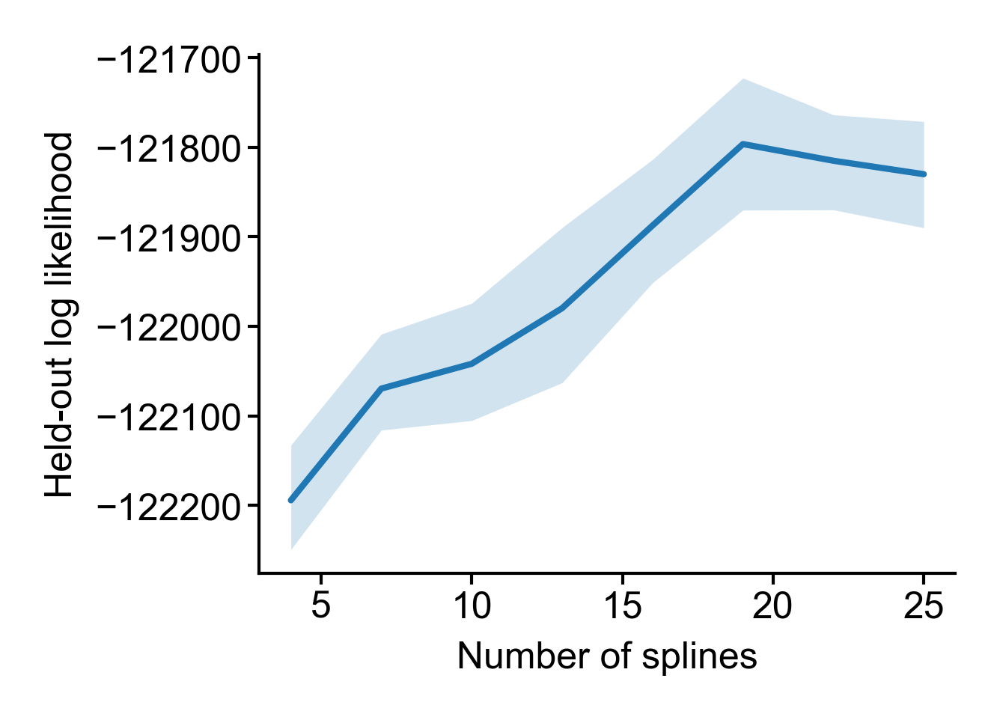

In [82]:
heldout_ll_df = (
    pd.DataFrame(valmap(lambda v: v.item(), out_ll), index=[0])
    .rename_axis(["n_splines", "fold"], axis=1)
    .melt(value_name="log_likelihood")
)
fig = figure(2, 1.5)
ax = sns.lineplot(data=heldout_ll_df, x="n_splines", y="log_likelihood", err_kws=dict(lw=0))
ax.set(xlabel="Number of splines", ylabel="Held-out log likelihood")
sns.despine()

In [84]:
heldout_ll_df.groupby('n_splines')['log_likelihood'].mean().sort_values(ascending=False)

n_splines
19   -121796.492188
22   -121815.096875
25   -121830.109375
16   -121887.467188
13   -121979.779688
10   -122041.871875
7    -122069.582812
4    -122194.307813
Name: log_likelihood, dtype: float64

<Axes: ylabel='Count'>

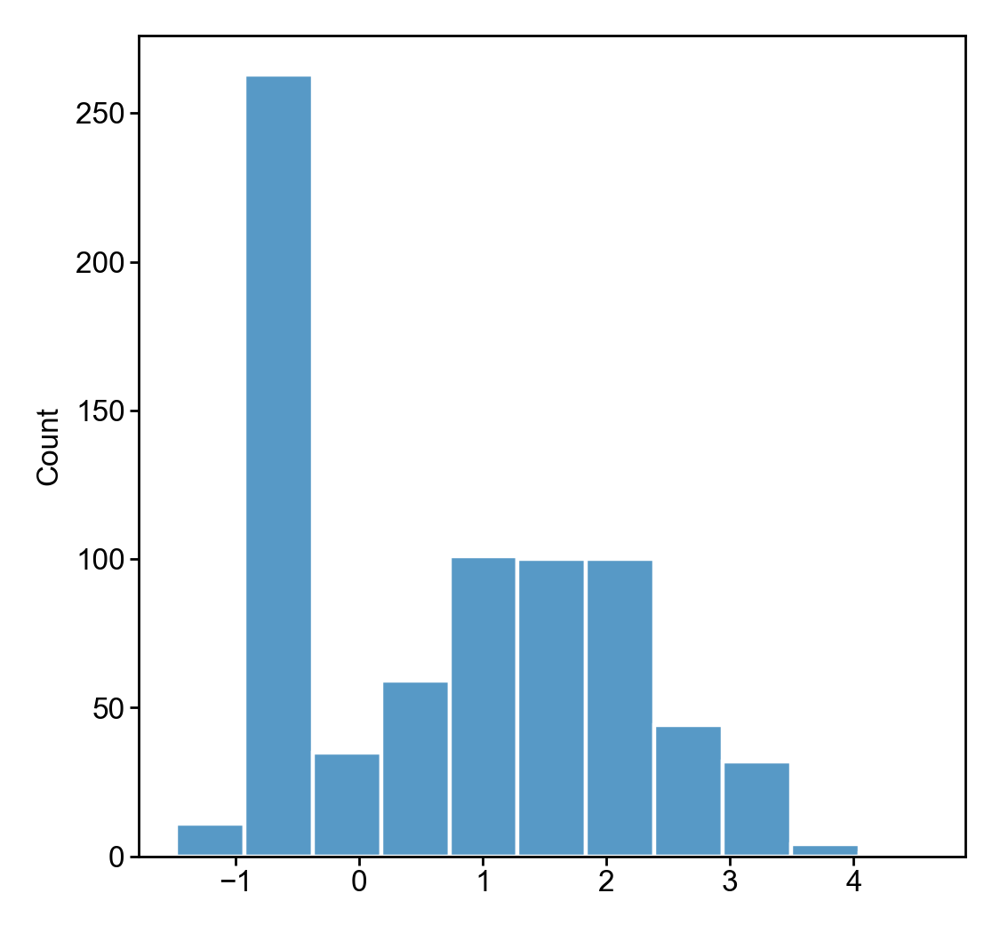

In [85]:
sns.histplot(optimized_params['basis_weights'].flatten())

In [86]:
bio_age = jnp.exp(optimized_params['basis_weights']) @ splines
distribution = tfp.distributions.DirichletMultinomial(
    total_count=syllable_counts_jax.sum(axis=1)[:, None],
    concentration=jnp.swapaxes(bio_age[:, ::4][None], 1, 2)
)
syllable_samples = distribution.sample(seed=jax.random.PRNGKey(0))

# syllable_samples = distribution.sample(sample_shape=2, seed=jax.random.PRNGKey(0))
# syllable_samples = jnp.vstack(syllable_samples)

In [87]:
bio_ages = get_biological_age(
    optimized_params,
    splines,
    age_samples,
    age_normalizer(age),
    syllable_counts_jax + 1,
    hypparams,
    age_unnormalizer,
)

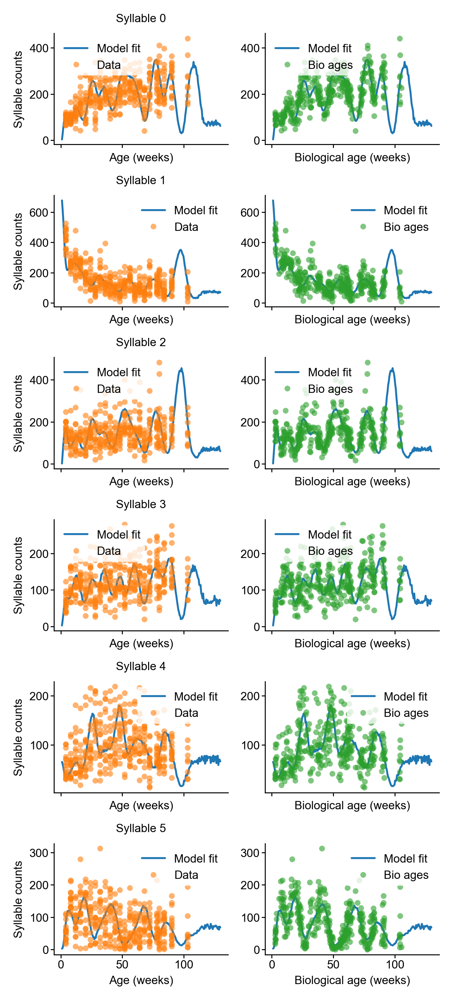

In [104]:
plot_syllables = 6
x = age_unnormalizer(age_samples[::4])

fig, ax = plt.subplots(
    plot_syllables, 2, figsize=(3.25, 1.2 * plot_syllables), sharex=True, sharey=False
)
for syllable in range(plot_syllables):
    avg_sample = syllable_samples[..., syllable].mean(0)
    a = ax[syllable, 0]
    a.plot(x, avg_sample, label="Model fit")
    a.plot(
        age, syllable_counts_jax[:, syllable], "o", label="Data", alpha=0.6, mew=0, ms=3
    )
    a.set(title=f"Syllable {syllable}", xlabel="Age (weeks)", ylabel="Syllable counts")
    l = a.legend(fancybox=False)
    l.get_frame().set_linewidth(0)
    a = ax[syllable, 1]
    a.plot(x, avg_sample, label="Model fit")
    a.plot(
        bio_ages,
        syllable_counts_jax[:, syllable],
        "o",
        label="Bio ages",
        alpha=0.6,
        mew=0,
        ms=3,
        c="C2",
    )
    a.set(xlabel="Biological age (weeks)")
    l = a.legend(fancybox=False)
    l.get_frame().set_linewidth(0)
sns.despine()
fig.tight_layout()

In [ ]:
n_splines = 25
use_log_age = False
age_normalizer, age_unnormalizer = age_normalizer_factory(
    min_age=1, max_age=130, log_transform=use_log_age
)
age_samples = np.linspace(0, 1, 1000)
age_sd = age_normalizer(3)

hypparams = {
    "age_sd": age_sd,
    "params_sd": 1,
}

spline_class, splines = create_splines(age_samples, df=n_splines)

params = fit_params(syllable_counts_jax, n_splines, age)

ll_fun = partial(
    neg_log_likelihood,
    bases=splines,
    age_samples=age_samples,
    true_age=age_normalizer(age),
    counts=syllable_counts_jax + 1,
    hypparams=hypparams,
)
optimized_params, loss = optimize(params, ll_fun, lr=0.15, n_iter=50)

bio_age = jnp.exp(optimized_params['basis_weights']) @ splines
distribution = tfp.distributions.DirichletMultinomial(
    total_count=syllable_counts_jax.sum(axis=1)[:, None],
    concentration=jnp.swapaxes(bio_age[:, ::4][None], 1, 2)
)
syllable_samples = distribution.sample(seed=jax.random.PRNGKey(0))

## How stable are different initializatons?

In [ ]:
lls = []
keep_params = []
seed = jax.random.PRNGKey(0)

spline_class, splines = create_splines(age_samples, df=10)

for i in tqdm(range(7)):
    seed, subkey = jax.random.split(seed)
    params = {'basis_weights': jax.random.uniform(seed, shape=(n_syllables, len(splines))) / len(splines)}

    ll_fun = partial(
        neg_log_likelihood,
        bases=splines,
        age_samples=age_samples,
        true_age=age_normalizer(age),
        counts=(syllable_counts_jax + 1),
        hypparams=hypparams,
    )
    optimized_params, loss = optimize(params, ll_fun, lr=0.4, n_iter=100)
    keep_params.append(optimized_params['basis_weights'])

  0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
keep_params = jnp.stack(keep_params)

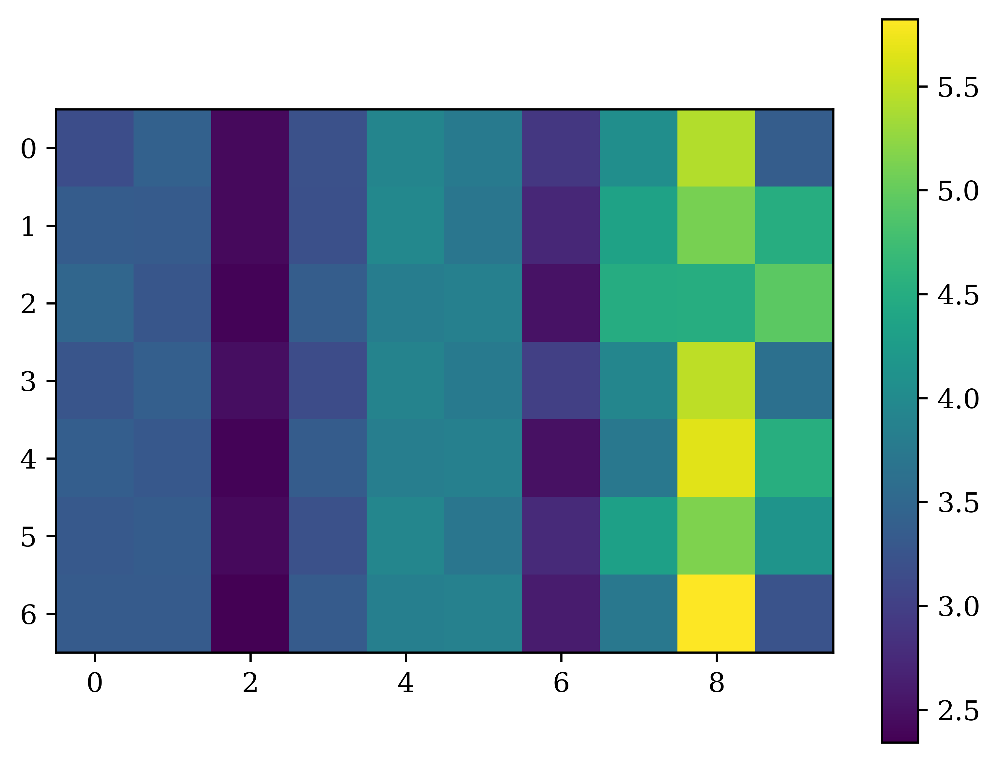

In [ ]:
plt.imshow(keep_params[:, 0])
plt.colorbar()

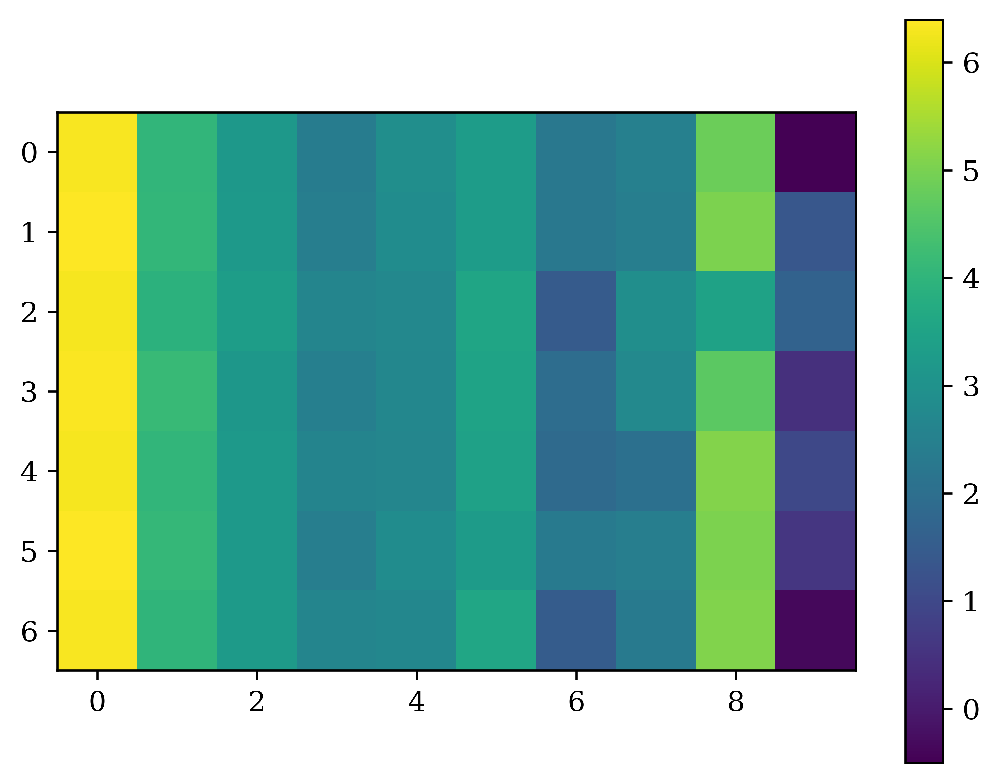

In [ ]:
plt.imshow(keep_params[:, 1])
plt.colorbar()

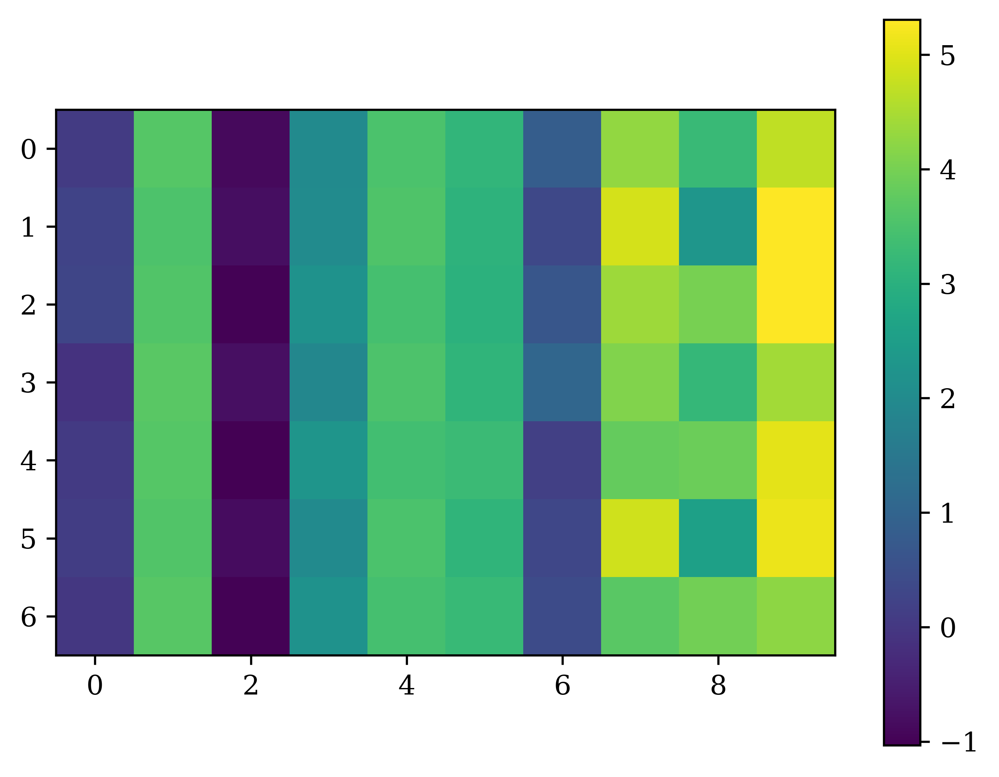

In [ ]:
plt.imshow(keep_params[:, 10])
plt.colorbar()

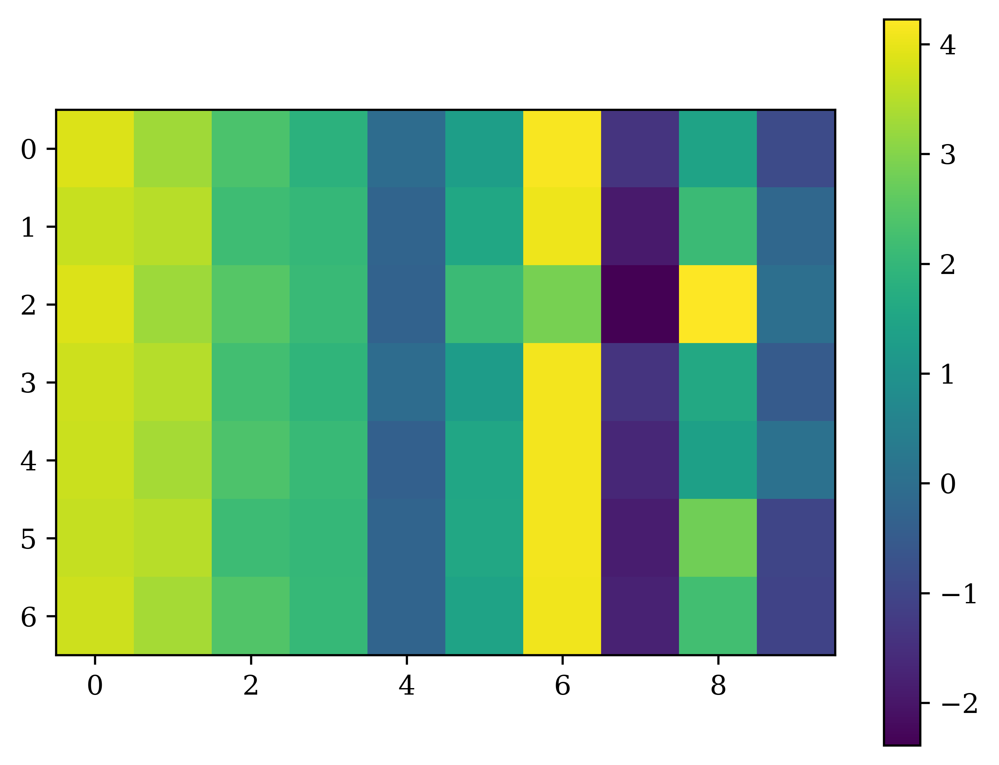

In [ ]:
plt.imshow(keep_params[:, 20])
plt.colorbar()

In [ ]:
lls = []
keep_params = []

spline_class, splines = create_splines(age_samples, df=10)

for scale in tqdm(np.linspace(0, 2, 5)):
    seed, subkey = jax.random.split(seed)
    params = {'basis_weights': jnp.ones((n_syllables, len(splines))) / len(splines) * scale}

    ll_fun = partial(
        neg_log_likelihood,
        bases=splines,
        age_samples=age_samples,
        true_age=age_normalizer(age),
        counts=(syllable_counts_jax + 1),
        hypparams=hypparams,
    )
    optimized_params, loss = optimize(params, ll_fun, lr=0.25, n_iter=60)
    keep_params.append(optimized_params['basis_weights'])

  0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
keep_params = jnp.stack(keep_params)

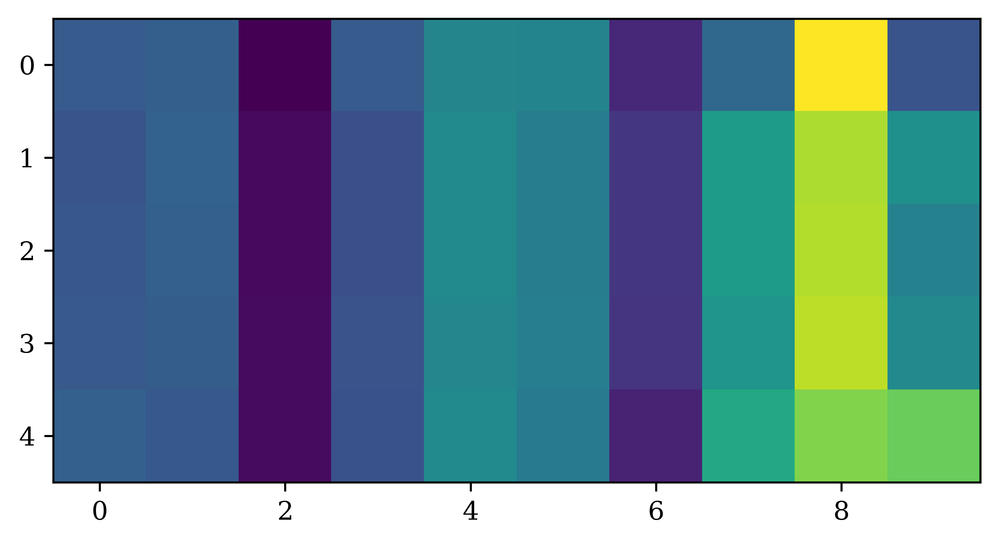

In [ ]:
plt.imshow(keep_params[:, 0])
plt.colorbar()

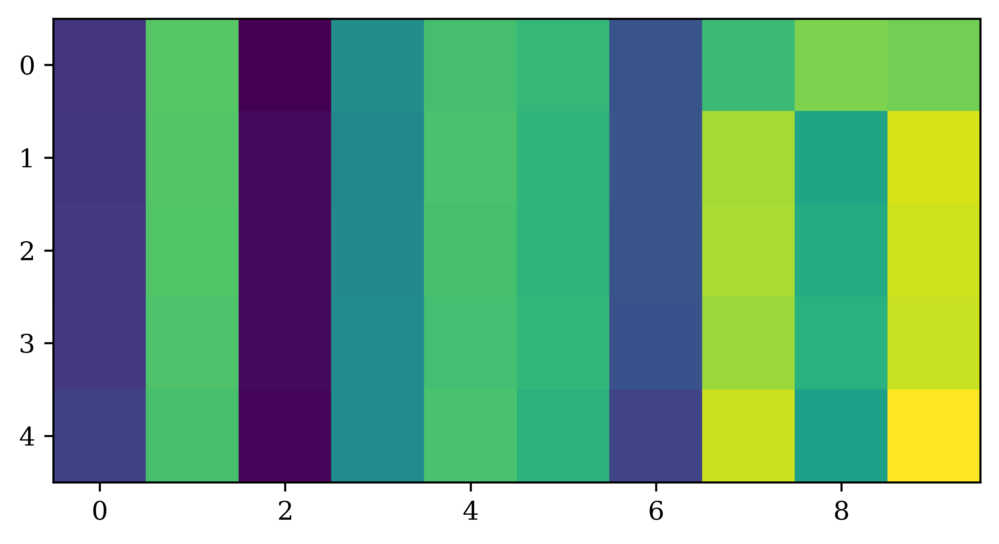

In [ ]:
plt.imshow(keep_params[:, 10])
plt.colorbar()

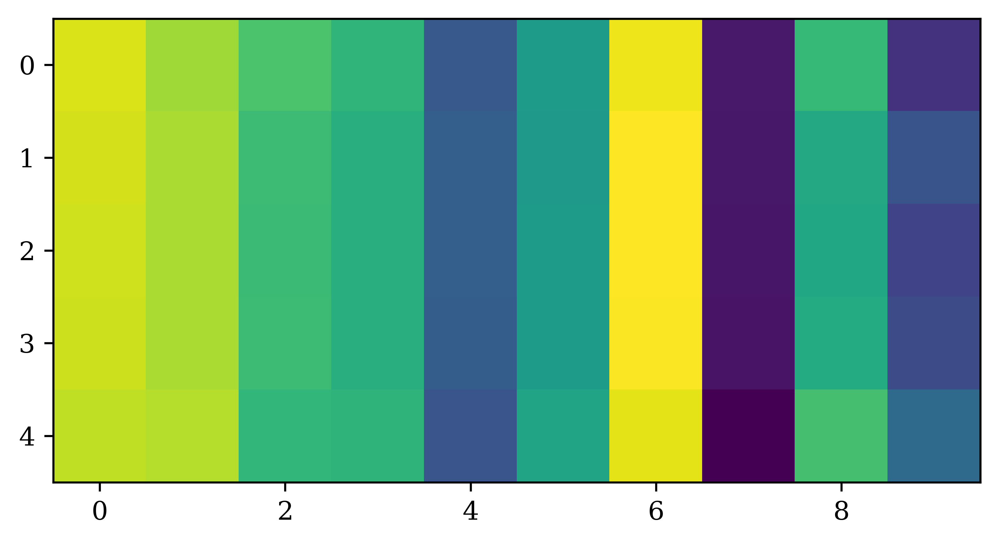

In [ ]:
plt.imshow(keep_params[:, 20])
plt.colorbar()

## Train optimized model

In [29]:
n_splines = 10

age_normalizer, age_unnormalizer = age_normalizer_factory(min_age=-5, max_age=150)
age_samples = np.linspace(0, 1, 1000)
age_sd = age_normalizer(10)
hypparams = {
    "age_sd": age_sd,
    "params_sd": 3,
}

# spline_class, splines = create_splines(age_samples, df=n_splines)
splines = piecewise_linear_bases(age_samples, jnp.linspace(0, 1, n_splines + 2)[1:-1])
params = {"basis_weights": jnp.ones((n_syllables, len(splines))) / len(splines)}

ll_fun = partial(
    neg_log_likelihood,
    bases=splines,
    age_samples=age_samples,
    true_age=age_normalizer(age),
    counts=syllable_counts_jax + 1,
    hypparams=hypparams,
)
optimized_params, loss = optimize(params, ll_fun, lr=0.4, n_iter=200)

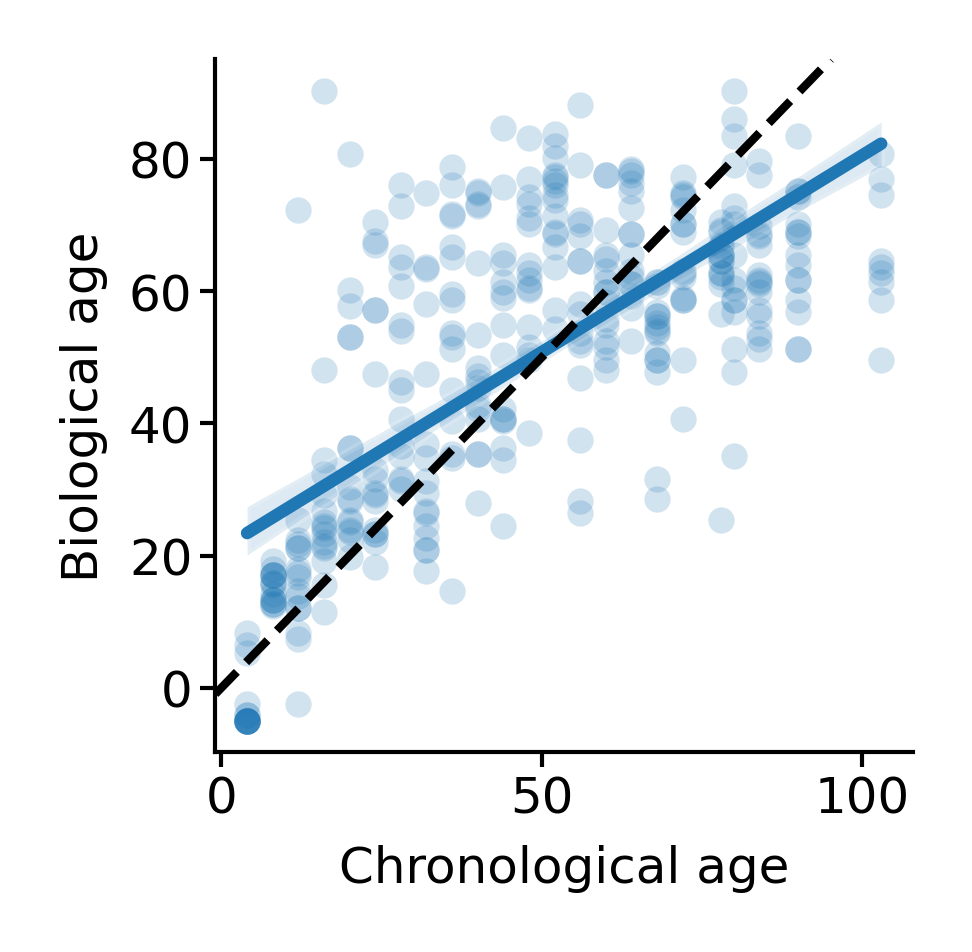

In [45]:
bio_ages = get_biological_age(
    optimized_params,
    splines,
    age_samples,
    age_normalizer(age),
    syllable_counts_jax + 1,
    hypparams,
    age_unnormalizer,
)
figure(1.5, 1.5)
ax = sns.regplot(
    x=age, y=bio_ages, scatter_kws={"alpha": 0.2, "linewidths": 0, "s": 10}
)
ax.set(xlabel="Chronological age", ylabel="Biological age")
add_identity(ax, color="k", ls="--")
sns.despine()

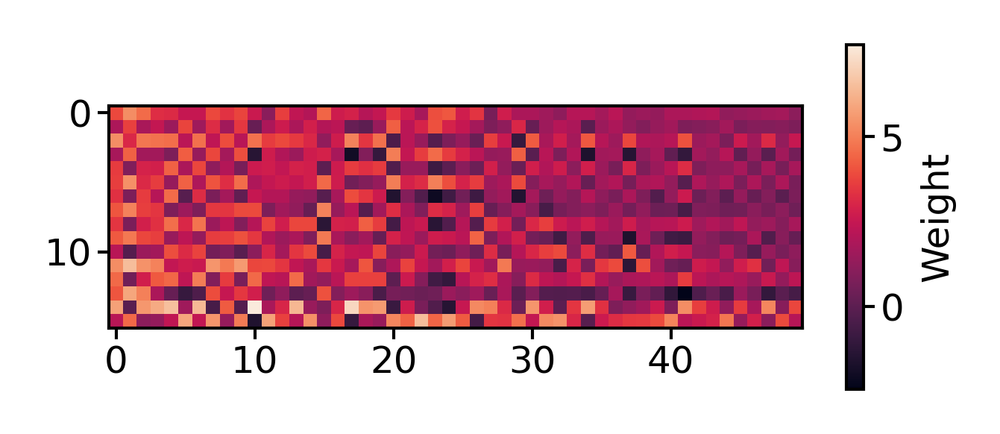

In [ ]:
figure(2.5, 1)
plt.imshow(optimized_params['basis_weights'].T)
plt.colorbar(label="Weight")

## Compare to linear regression

In [31]:
from sklearn.preprocessing import StandardScaler
from sklearn.cross_decomposition import PLSRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import StratifiedKFold, cross_val_predict

In [32]:
pipeline = make_pipeline(StandardScaler(), PLSRegression(n_components=5))

In [33]:
lm_bio_ages = cross_val_predict(
    pipeline, syllable_counts_jax, age, cv=StratifiedKFold(n_splits=3)
)

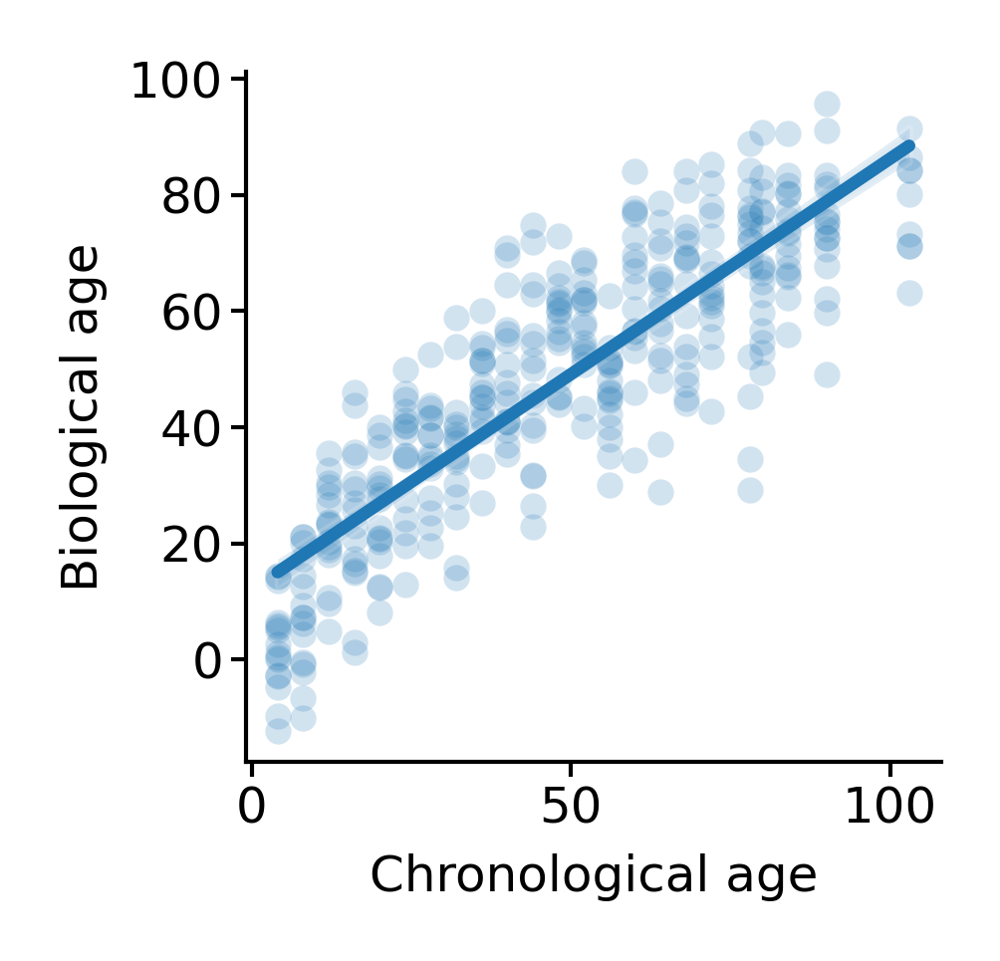

In [34]:
figure(1.5, 1.5)
ax = sns.regplot(
    x=age, y=lm_bio_ages, scatter_kws={"alpha": 0.2, "linewidths": 0, "s": 10}
)
ax.set(xlabel="Chronological age", ylabel="Biological age")
sns.despine()

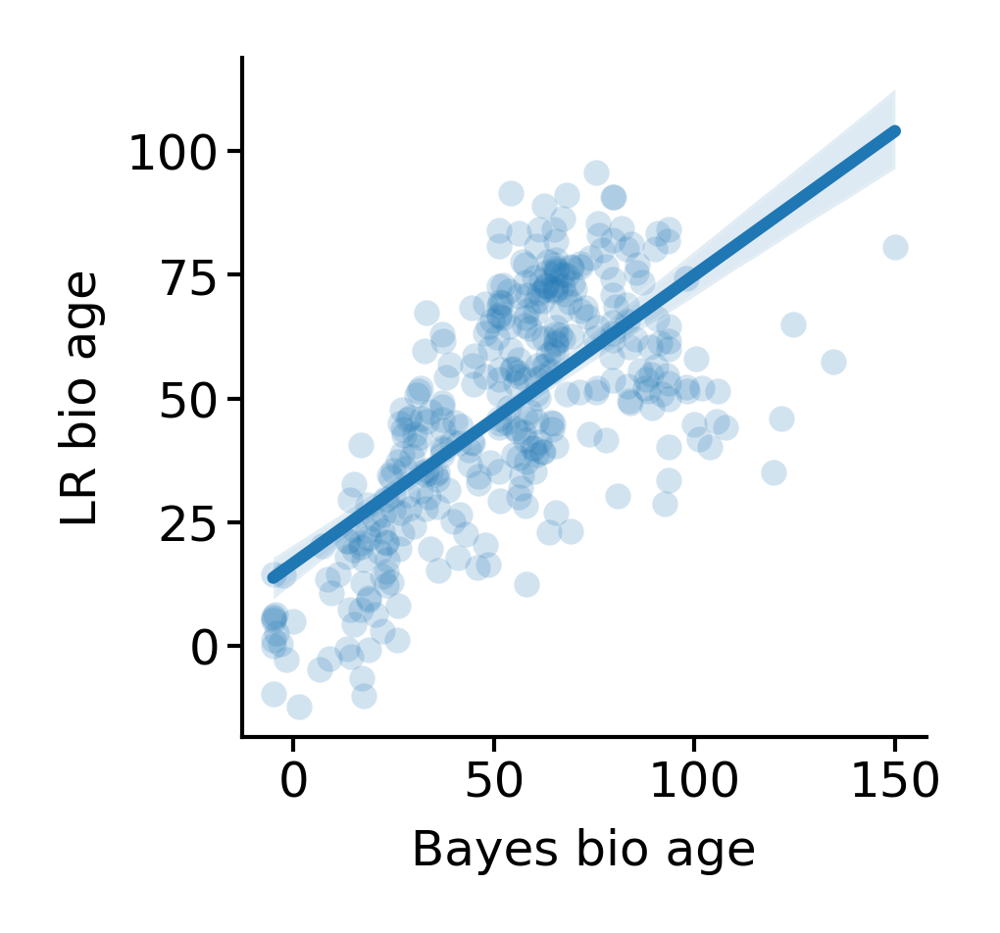

In [35]:
figure(1.5, 1.5)
ax = sns.regplot(
    x=bio_ages, y=lm_bio_ages, scatter_kws={"alpha": 0.2, "linewidths": 0, "s": 10}
)
ax.set(xlabel="Bayes bio age", ylabel="LR bio age")
sns.despine()

In [36]:
lm_resid = age - lm_bio_ages
bio_resid = age - bio_ages

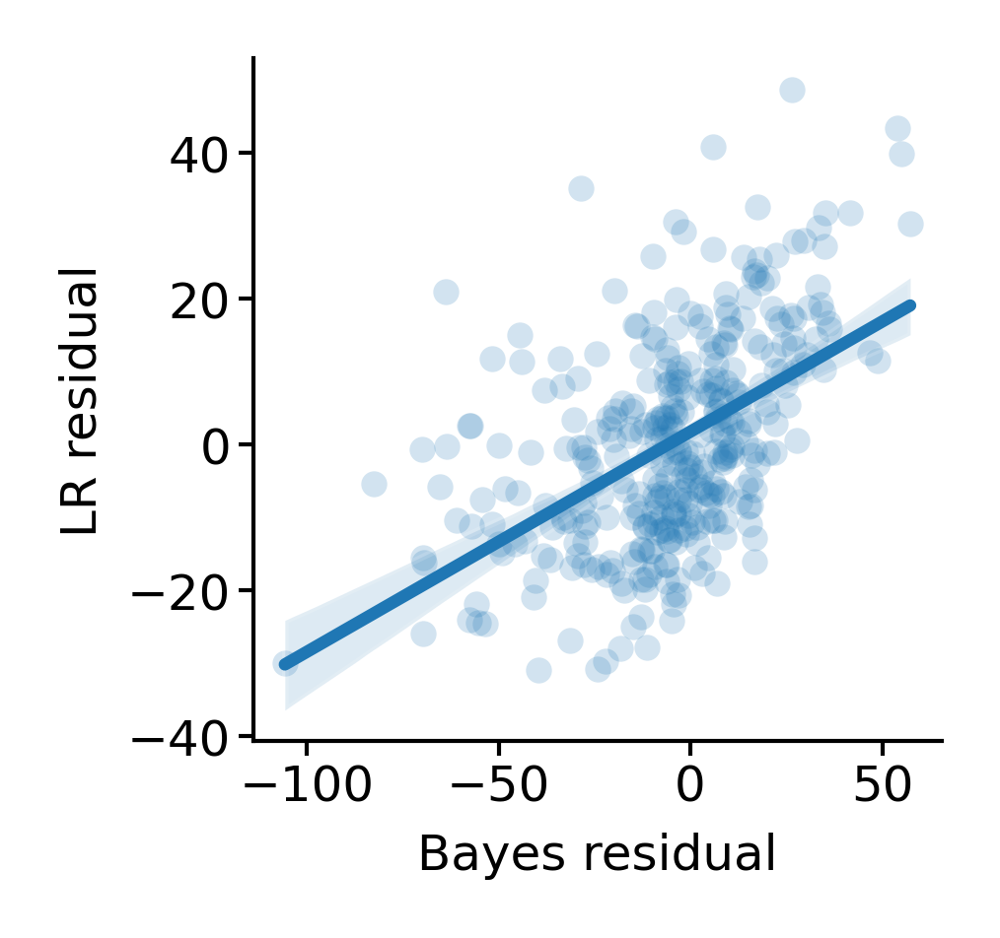

In [37]:
figure(1.5, 1.5)
ax = sns.regplot(
    x=bio_resid, y=lm_resid, scatter_kws={"alpha": 0.2, "linewidths": 0, "s": 10}
)
ax.set(xlabel="Bayes residual", ylabel="LR residual")
sns.despine()

In [ ]:
df.index.names

FrozenList(['age', 'mouse', 'subject_name', 'session_name', 'uuid', 'date'])

## Correlate size with syllable use

In [29]:
pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_mouse_area_df_v00.parquet'
size_df = pd.read_parquet(pth)
size_df = size_df.loc[df.index]

In [33]:
new_df = df.copy()
new_df.loc[size_df.index, "size"] = size_df[0.5]

In [34]:
new_df.head()

0  \
age mouse    subject_name session_name uuid                                 date                         
4   4M_01_01 4M_01_01     otgy_4M_01   e6ad4e15-0ce1-4833-a751-09aa15bfa2e5 2023-12-01 10:54:30  106.0   
    4M_01_02 4M_01_02     otgy_4M_01   2bb5e7fa-02cd-4694-accf-fed9651b1beb 2023-12-01 08:00:22  112.0   
    4M_01_03 4M_01_03     otgy_4M_01   7daed982-62e5-4695-971f-c229381d7521 2023-12-01 11:04:03  114.0   
    4M_01_04 4M_01_04     otgy_4M_01   43e12fcc-2119-4e15-b11c-add440ca5f74 2023-12-01 07:51:47  108.0   
    4M_02_01 4M_02_01     otgy_4M_02   6568fdb5-82b5-4241-8ccb-572ae49bd87a 2023-12-01 12:53:09   67.0   

                                                                                                     1  \
age mouse    subject_name session_name uuid                                 date                         
4   4M_01_01 4M_01_01     otgy_4M_01   e6ad4e15-0ce1-4833-a751-09aa15bfa2e5 2023-12-01 10:54:30  413.0   
    4M_01_02 4M_01_02     otgy_4M_01   2bb5e7fa-02cd-4694-accf-fed9651b1beb 2023-12-01 08:00:22  417.0   
    4M_01_03 4M_01_03     otgy_4M_01   7daed982-62e5-4695-971f-c229381d7521 2023-12-01 11:04:03  454.0   
    4M_01_04 4M_01_04     otgy_4M_01   43e12fcc-2119-4e15-b11c-add440ca5f74 2023-12-01 07:51:47  332.0   
    4M_02_01 4M_02_01     otgy_4M_02   6568fdb5-82b5-4241-8ccb-572ae49bd87a 2023-12-01 12:53:09  491.0   

                                                                                                     2  \
age mouse    subject_name session_name uuid                                 date                         
4   4M_01_01 4M_01_01     otgy_4M_01   e6ad4e15-0ce1-4833-a751-09aa15bfa2e5 2023-12-01 10:54:30  144.0   
    4M_01_02 4M_01_02     otgy_4M_01   2bb5e7fa-02cd-4694-accf-fed9651b1beb 2023-12-01 08:00:22  179.0   
    4M_01_03 4M_01_03     otgy_4M_01   7daed982-62e5-4695-971f-c229381d7521 2023-12-01 11:04:03  135.0   
    4M_01_04 4M_01_04     otgy_4M_01   43e12fcc-2119-4e15-b11c-add440ca5f74 2023-12-01 07:51:47  198.0   
    4M_02_01 4M_02_01     otgy_4M_02   6568fdb5-82b5-4241-8ccb-572ae49bd87a 2023-12-01 12:53:09  167.0   

                                                                                                    3  \
age mouse    subject_name session_name uuid                                 date                        
4   4M_01_01 4M_01_01     otgy_4M_01   e6ad4e15-0ce1-4833-a751-09aa15bfa2e5 2023-12-01 10:54:30  92.0   
    4M_01_02 4M_01_02     otgy_4M_01   2bb5e7fa-02cd-4694-accf-fed9651b1beb 2023-12-01 08:00:22  72.0   
    4M_01_03 4M_01_03     otgy_4M_01   7daed982-62e5-4695-971f-c229381d7521 2023-12-01 11:04:03  74.0   
    4M_01_04 4M_01_04     otgy_4M_01   43e12fcc-2119-4e15-b11c-add440ca5f74 2023-12-01 07:51:47  37.0   
    4M_02_01 4M_02_01     otgy_4M_02   6568fdb5-82b5-4241-8ccb-572ae49bd87a 2023-12-01 12:53:09  40.0   

                                                                                                     4  \
age mouse    subject_name session_name uuid                                 date                         
4   4M_01_01 4M_01_01     otgy_4M_01   e6ad4e15-0ce1-4833-a751-09aa15bfa2e5 2023-12-01 10:54:30   76.0   
    4M_01_02 4M_01_02     otgy_4M_01   2bb5e7fa-02cd-4694-accf-fed9651b1beb 2023-12-01 08:00:22   70.0   
    4M_01_03 4M_01_03     otgy_4M_01   7daed982-62e5-4695-971f-c229381d7521 2023-12-01 11:04:03   41.0   
    4M_01_04 4M_01_04     otgy_4M_01   43e12fcc-2119-4e15-b11c-add440ca5f74 2023-12-01 07:51:47  101.0   
    4M_02_01 4M_02_01     otgy_4M_02   6568fdb5-82b5-4241-8ccb-572ae49bd87a 2023-12-01 12:53:09   72.0   

                                                                                                     5  \
age mouse    subject_name session_name uuid                                 date                         
4   4M_01_01 4M_01_01     otgy_4M_01   e6ad4e15-0ce1-4833-a751-09aa15bfa2e5 2023-12-01 10:54:30  111.0   
    4M_01_02 4M_01_02     otgy_4M_01   2bb5e7fa-02cd-4694-accf-fed9651b1beb

In [58]:
new_df['size_cut'] = pd.cut(new_df['size'], bins=13, labels=False)
new_df['age_cut'] = pd.cut(new_df.index.get_level_values('age'), bins=13, labels=False)

In [59]:
sizes = new_df.groupby('size_cut')['size'].mean()
ages = new_df.groupby('age_cut').apply(lambda x: x.index.get_level_values('age').to_numpy().mean())

In [60]:
sizes

size_cut
0     349.600000
1     386.500000
2     439.500000
3     478.066667
4     529.047619
5     568.684211
6     612.569620
7     655.563380
8     699.754098
9     740.647059
10    789.923077
11    836.500000
12    878.666667
Name: size, dtype: float64

In [61]:
ages

age_cut
0       6.000000
1      14.000000
2      22.000000
3      30.064516
4      38.000000
5      46.000000
6      54.000000
7      62.000000
8      70.000000
9      79.000000
10     84.000000
11     90.000000
12    103.000000
dtype: float64

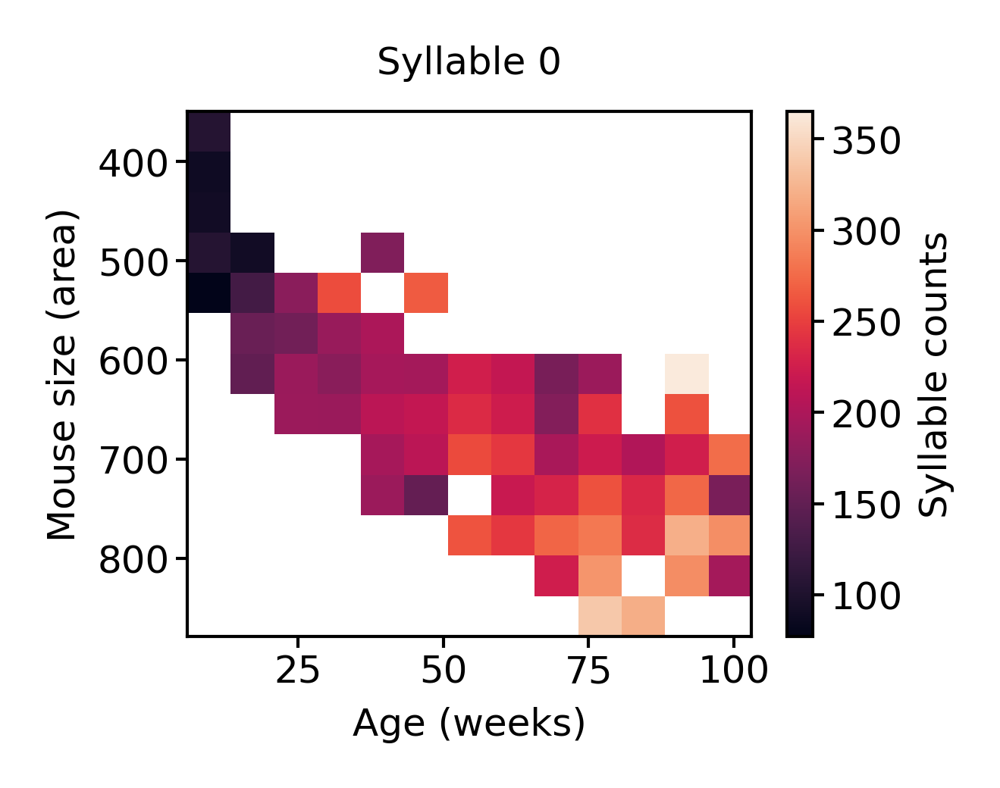

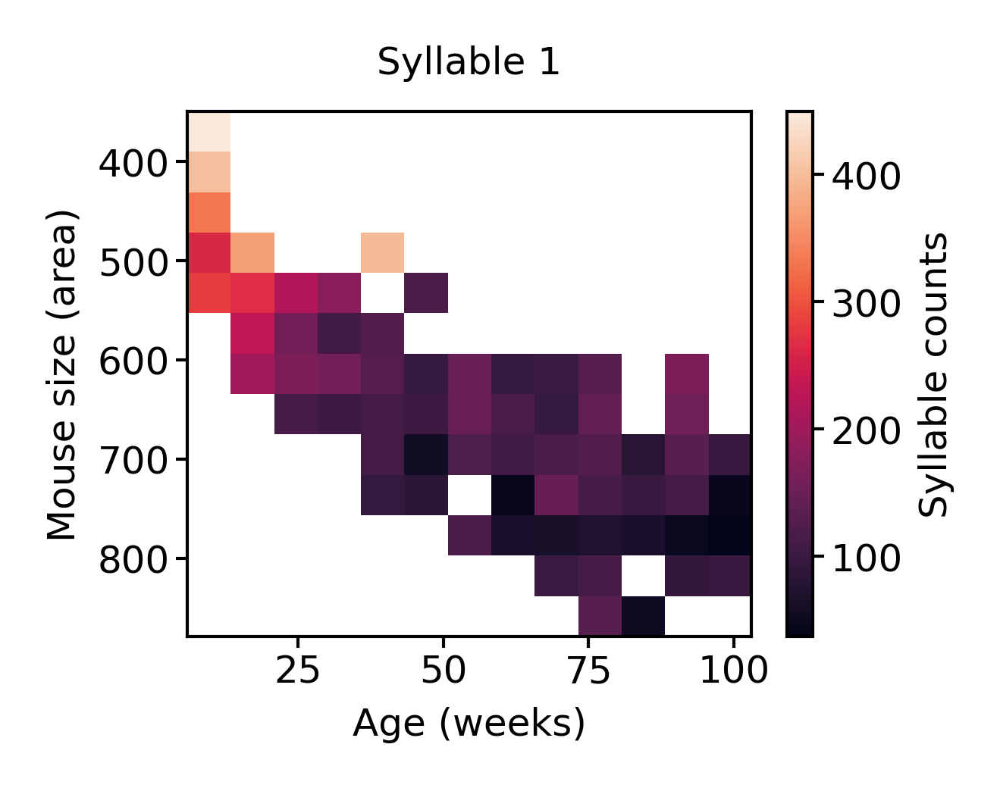

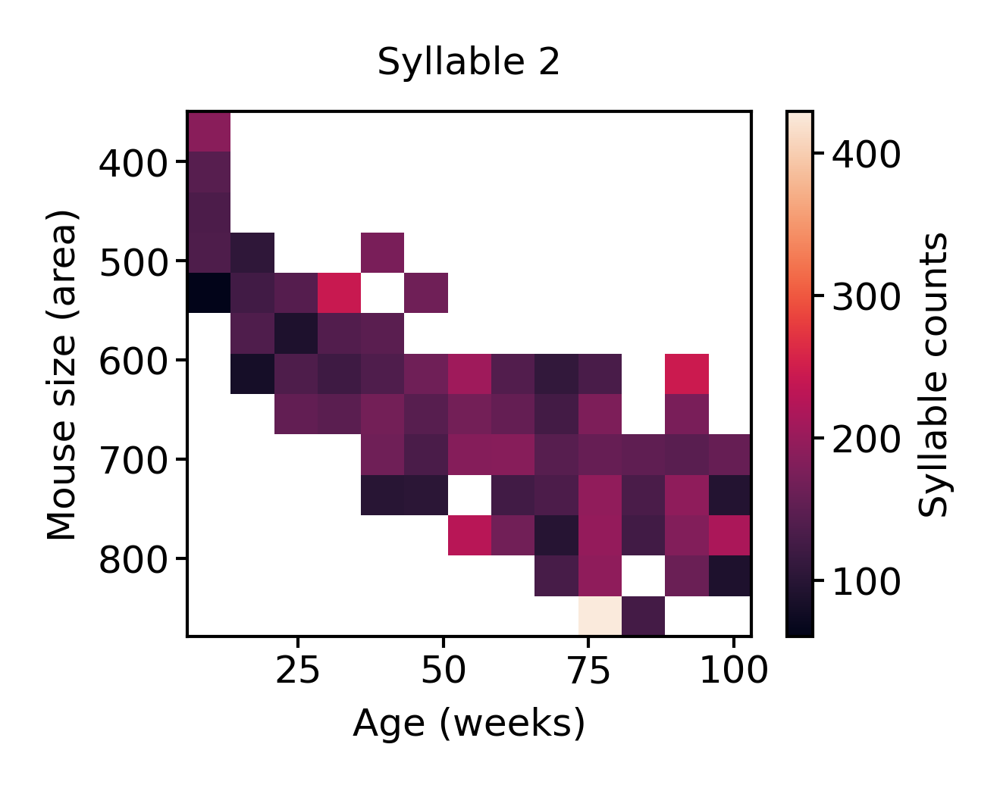

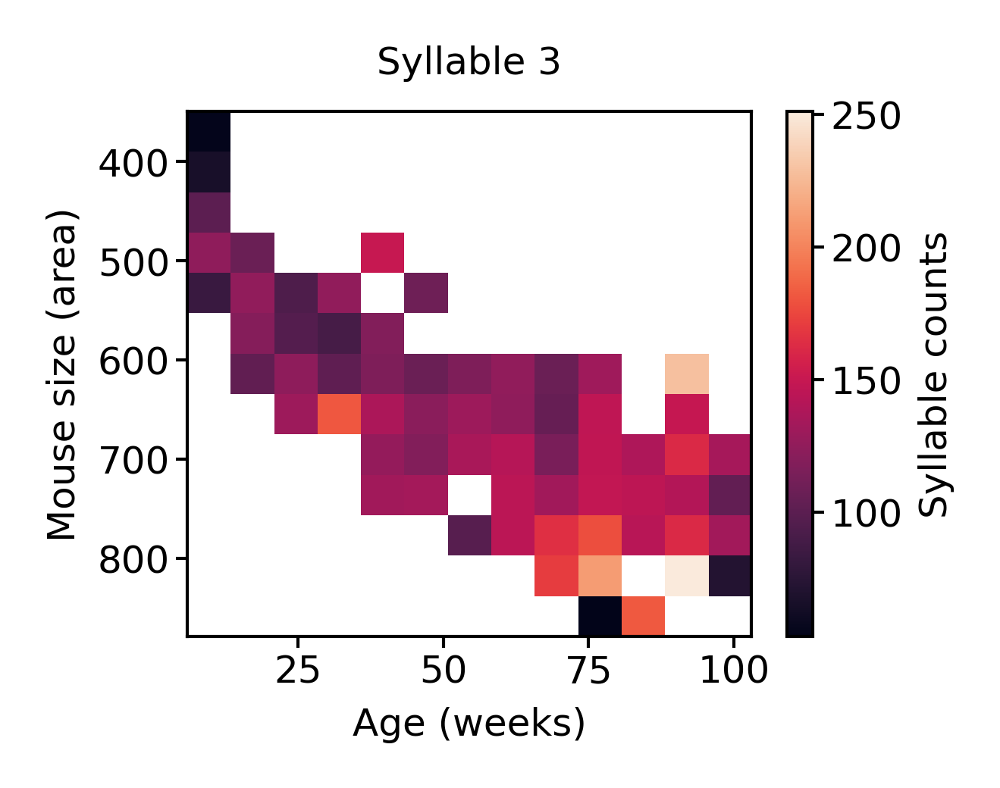

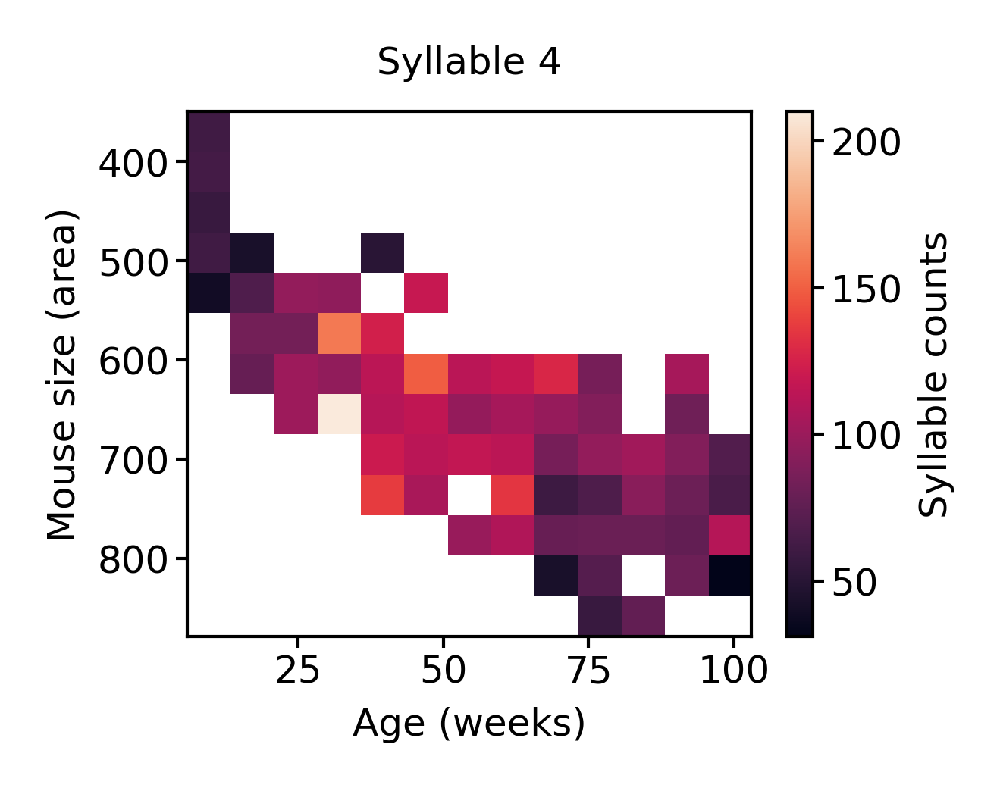

...

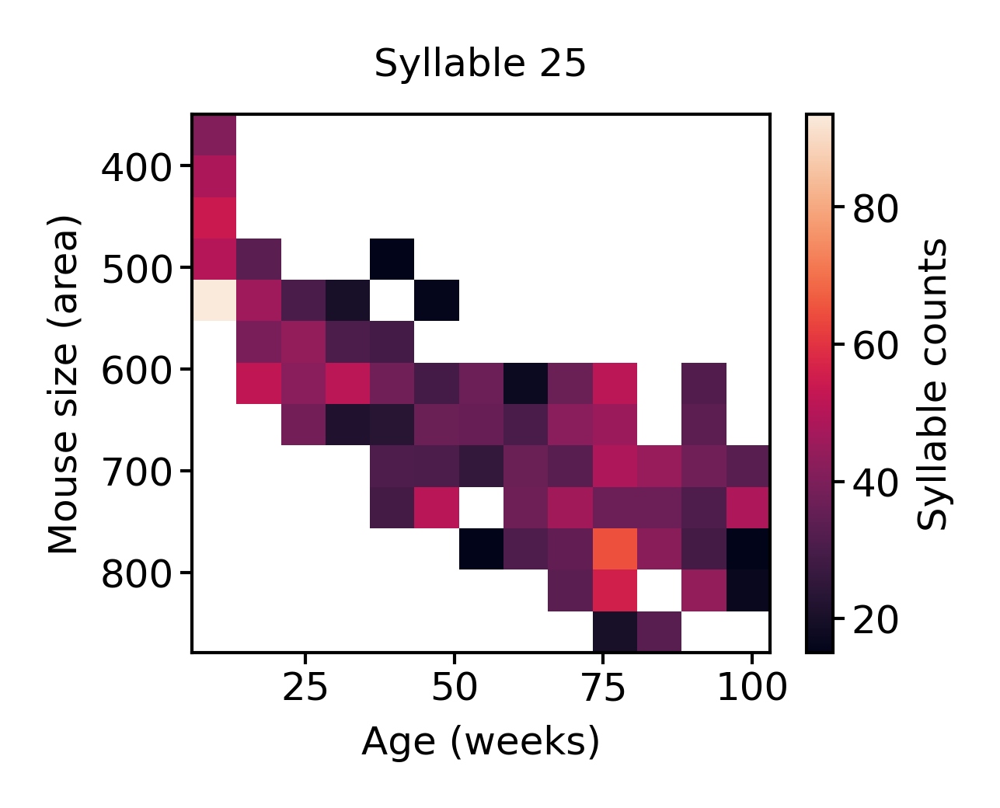

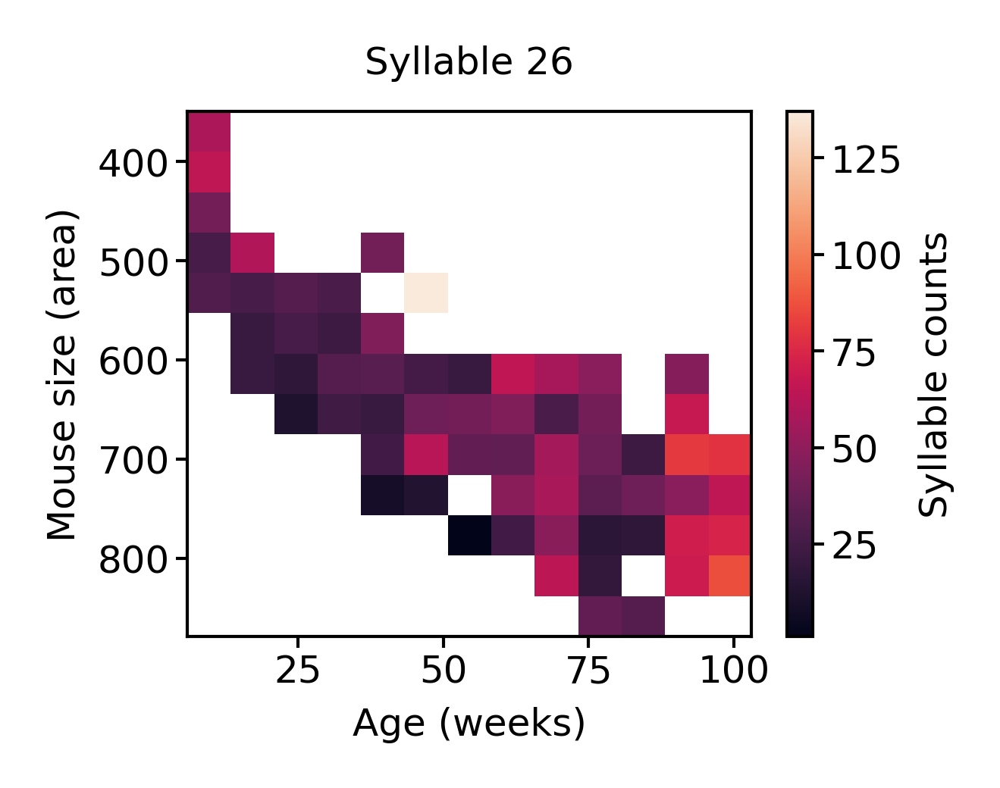

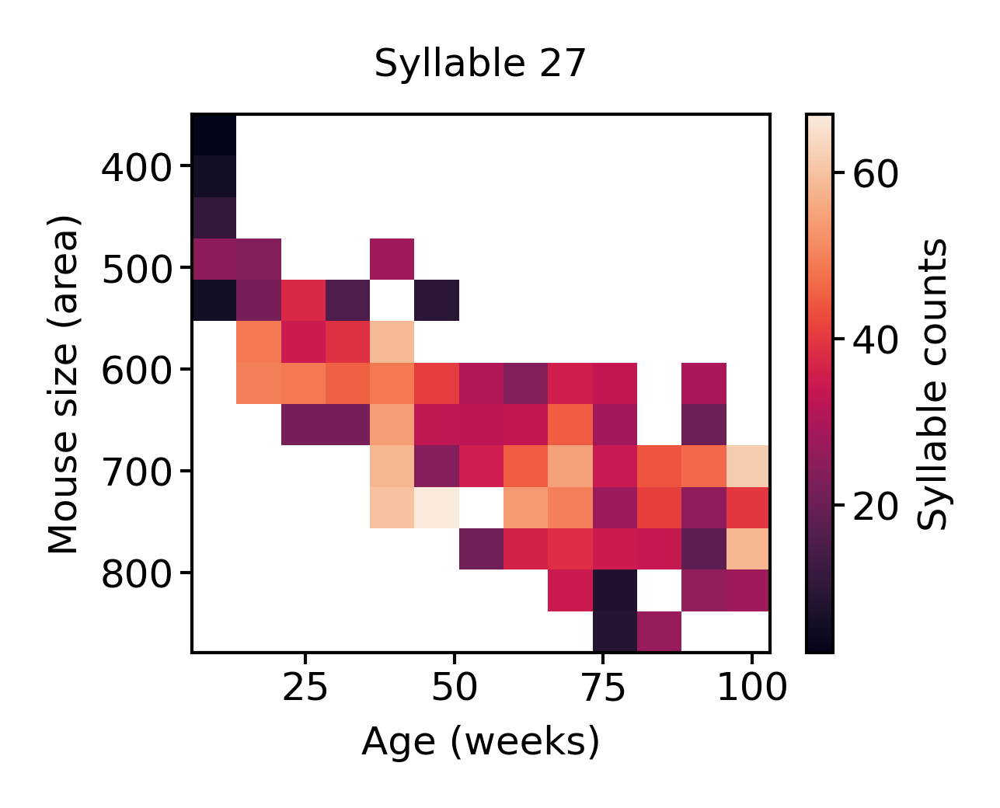

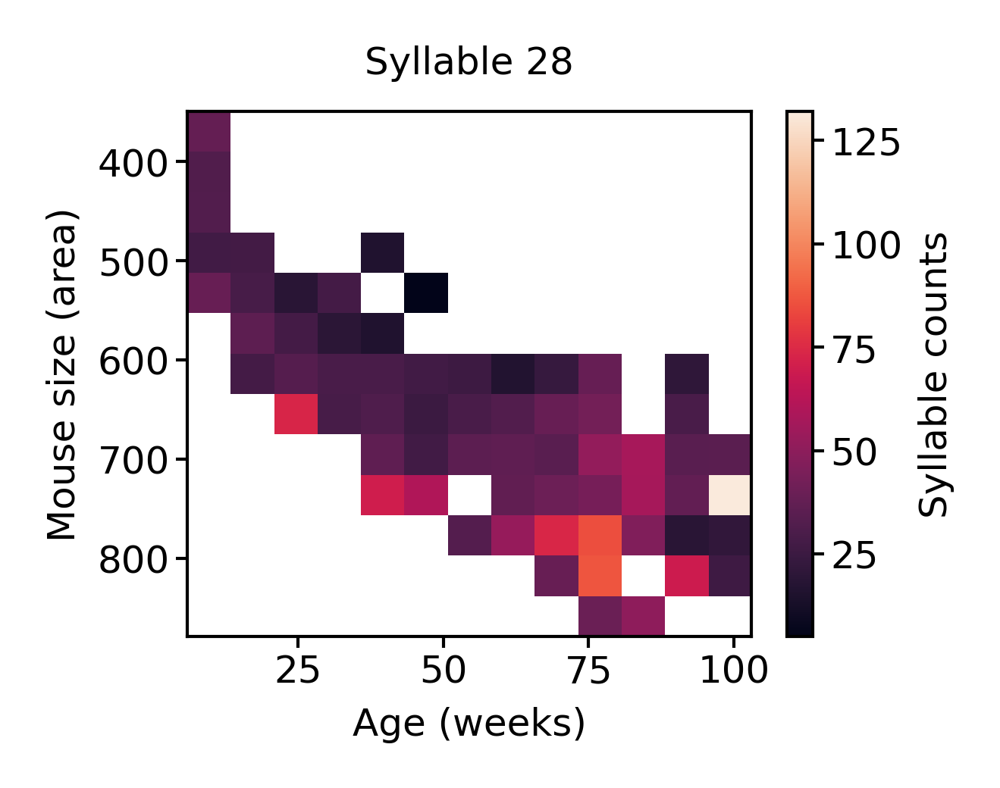

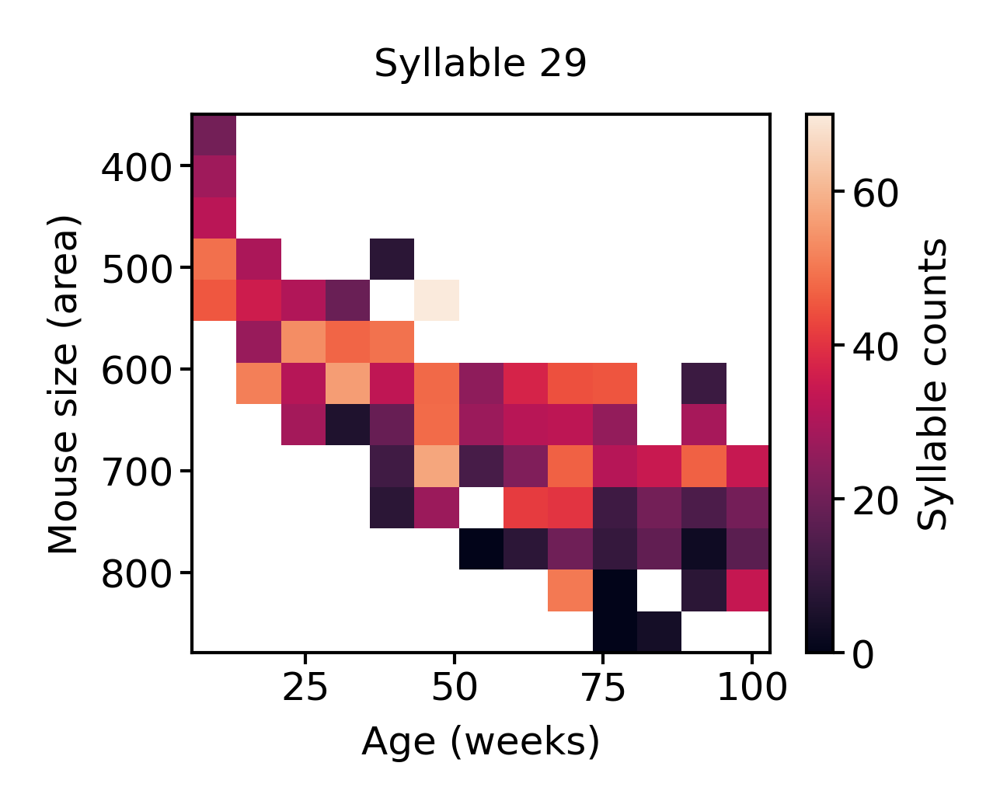

In [62]:
syllable = 0
for syllable in range(30):
    tmp = new_df.pivot_table(
        index="size_cut", columns="age_cut", values=syllable, aggfunc="mean", fill_value=np.nan
    ).astype(float)
    figure(2, 1.5)
    plt.imshow(tmp, extent=(ages.iloc[0], ages.iloc[-1], sizes.iloc[-1], sizes.iloc[0]), aspect='auto')
    plt.title(f"Syllable {syllable}")
    plt.xlabel("Age (weeks)")
    plt.ylabel("Mouse size (area)")
    plt.colorbar(label="Syllable counts")
    plt.show()

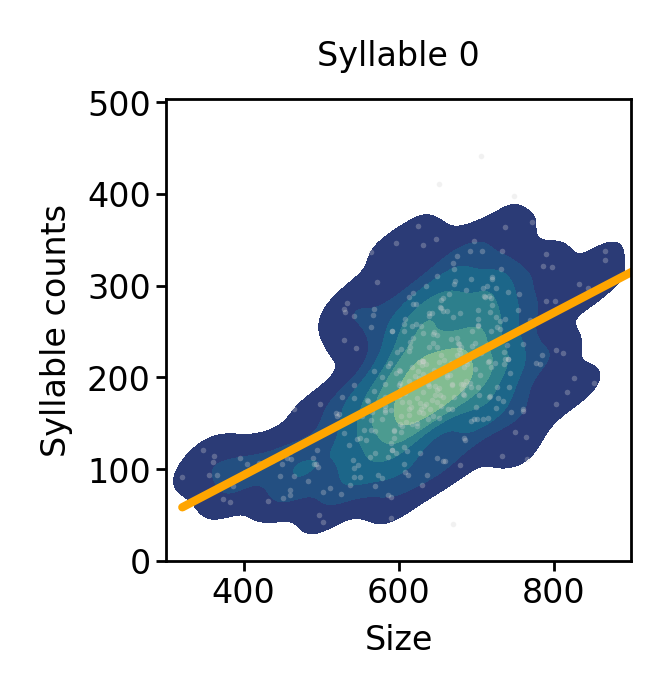

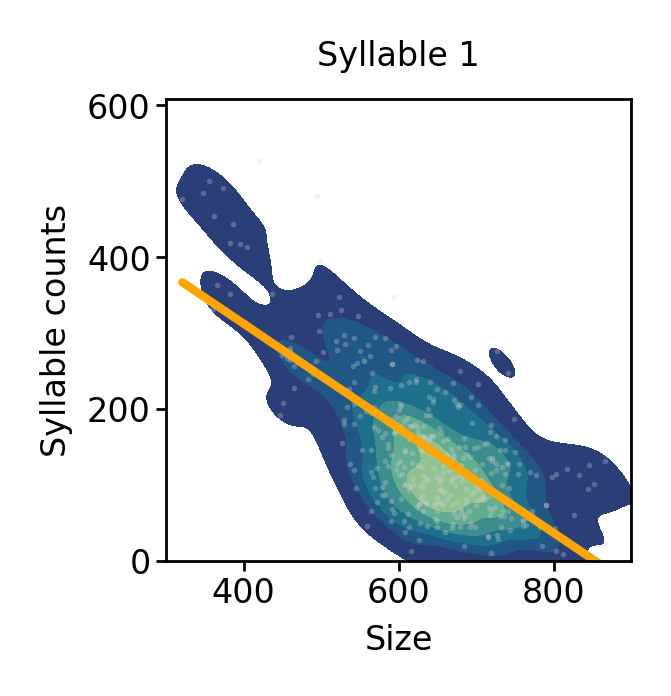

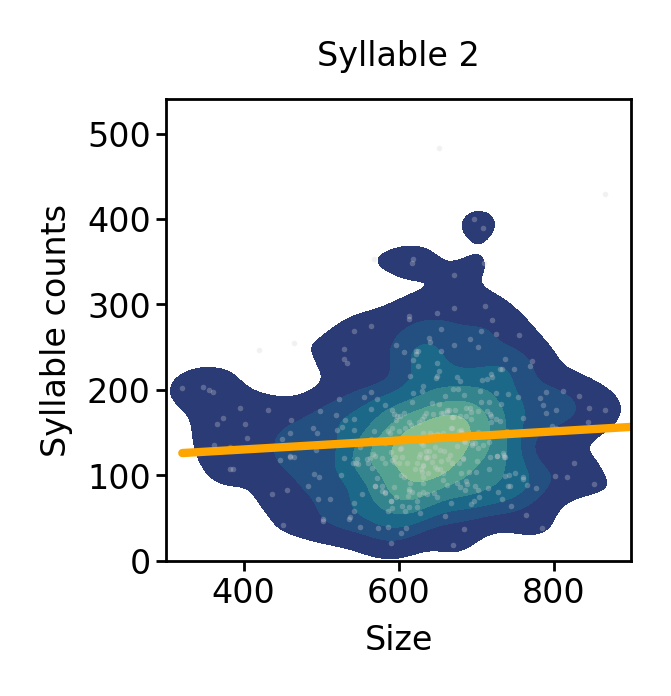

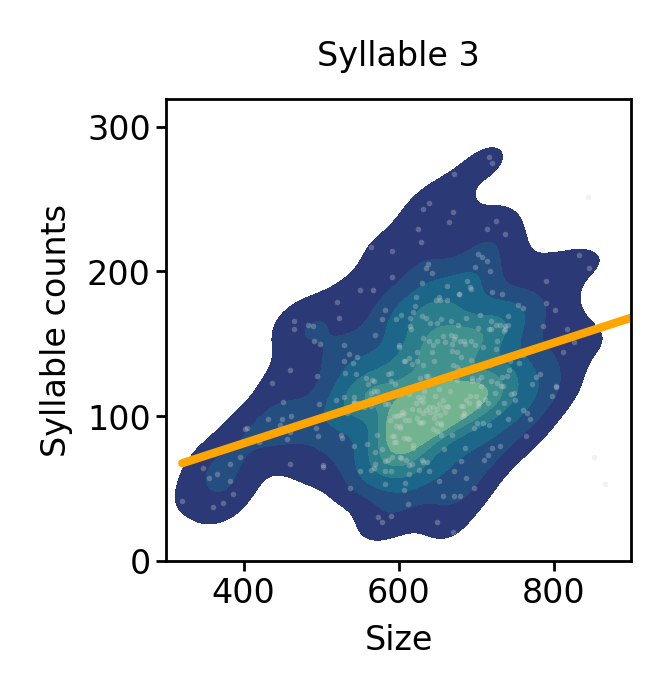

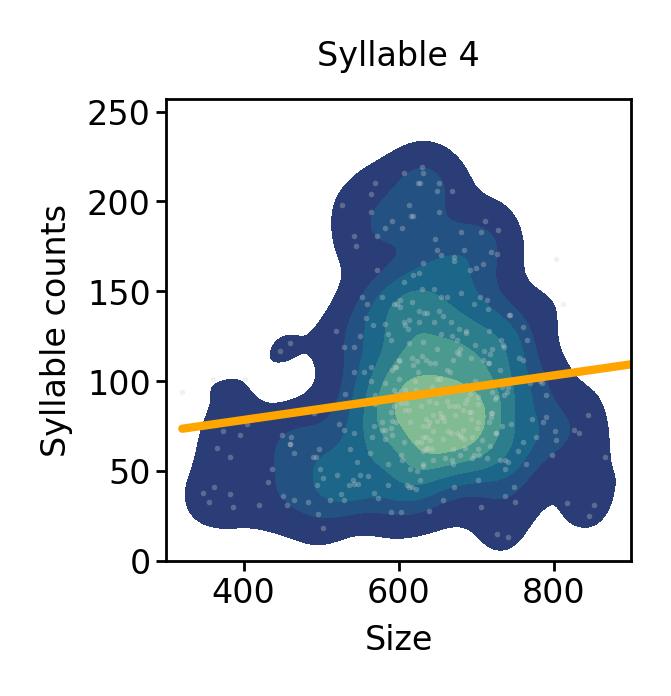

...

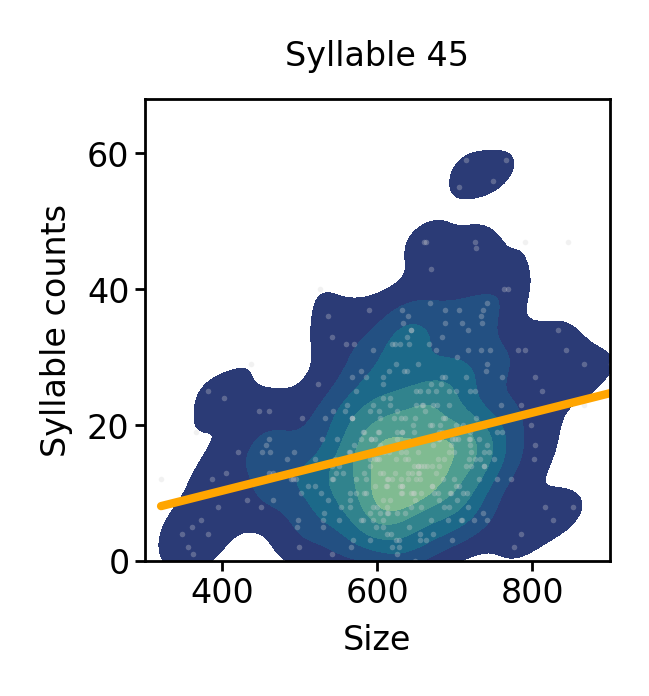

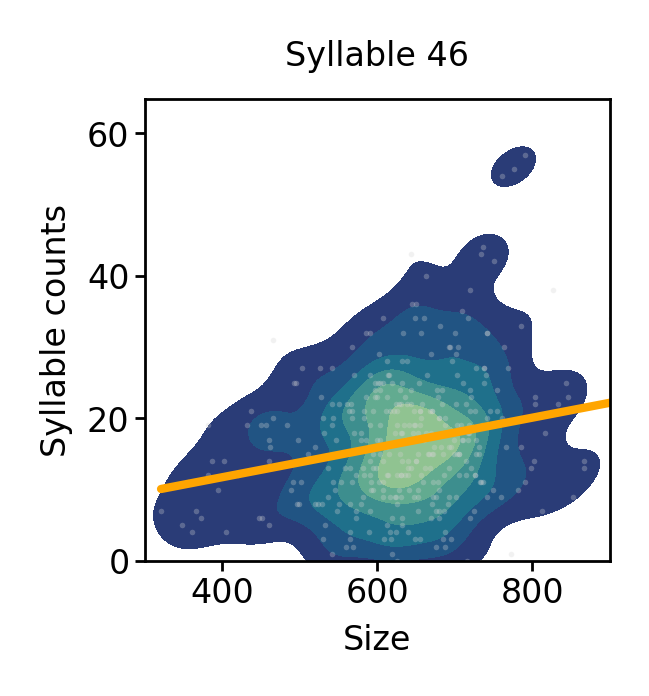

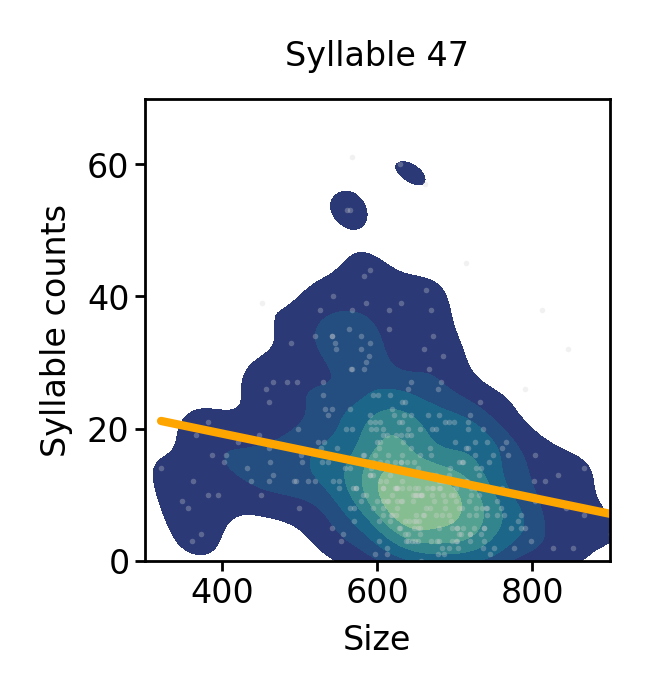

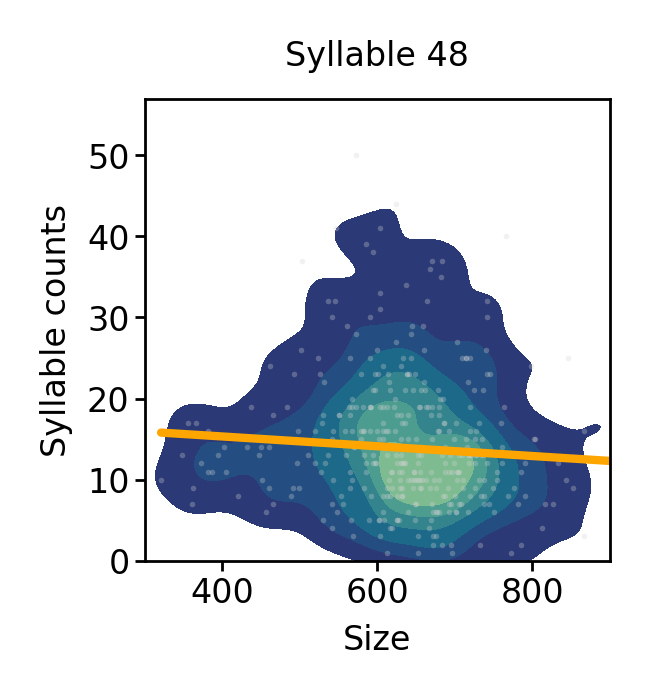

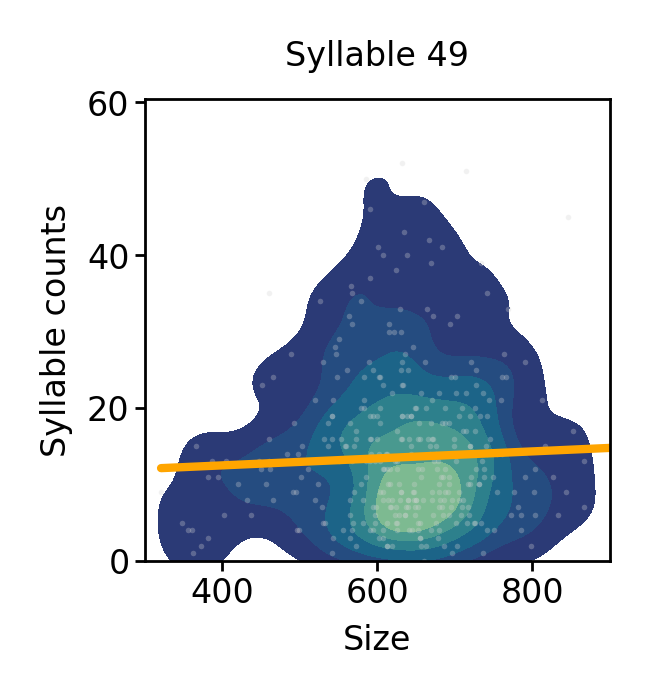

In [48]:
size_corrs = []
size_cuts = pd.cut(size_df[0.5].to_numpy(), bins=7, labels=False)
for syllable in range(50):
    fig = plt.figure(figsize=(1.5, 1.5))
    ax = sns.kdeplot(
        x=size_df[0.5],
        y=df[syllable],
        fill=True,
        levels=7,
        cmap="crest_r",
        bw_adjust=0.75,
    )
    plt.scatter(size_df[0.5], df[syllable], s=1, alpha=0.3, linewidths=0, c="lightgray")
    sns.regplot(
        x=size_df[0.5],
        y=df[syllable],
        scatter=False,
        ci=None,
        color="orange",
        robust=True,
    )
    ax.set(xlabel="Size", ylabel="Syllable counts", xlim=(300, 900), ylim=(0, None))
    plt.title(f"Syllable {syllable}")
    plt.show()
    size_corrs.append(size_df[0.5].corr(df[syllable]))

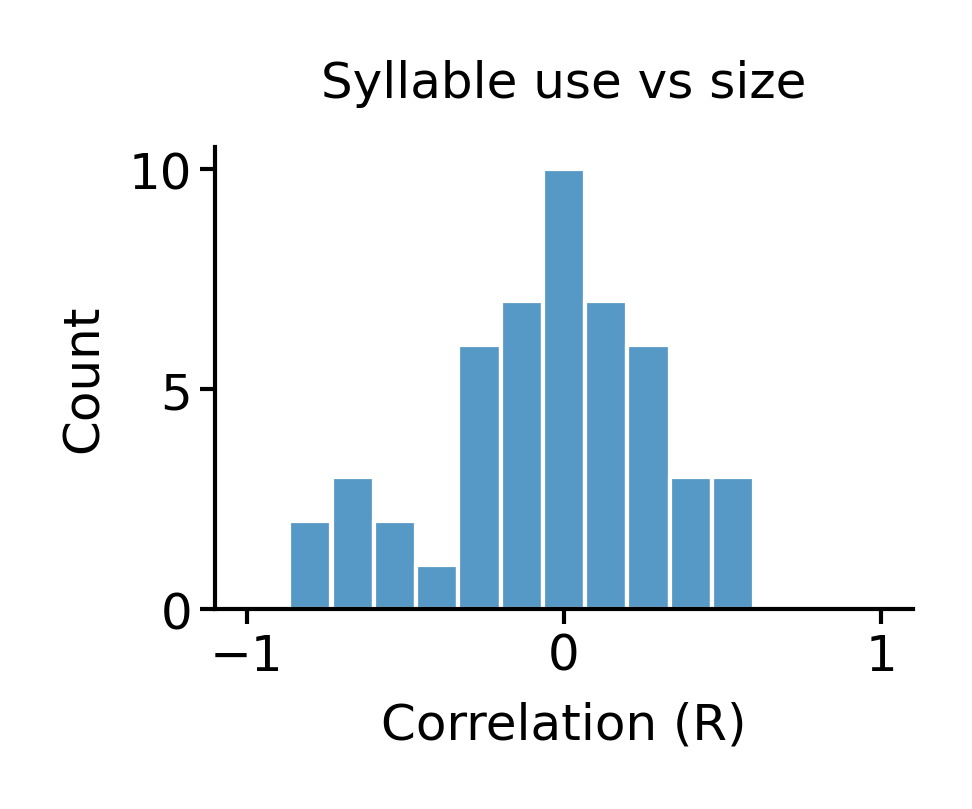

In [59]:
fig = figure(1.5, 1)
ax = sns.histplot(size_corrs, bins=np.linspace(-1, 1, 16))
ax.set(xlabel="Correlation (R)", title="Syllable use vs size")
sns.despine()

## Try adding size into model

In [4]:
from aging.behavior.bio_age_model import neg_log_likelihood_v2

In [5]:
pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_mouse_area_df_v00.parquet'
size_df = pd.read_parquet(pth)
size_df = size_df.loc[df.index]

In [28]:
n_splines = 10
n_size_splines = 7

age_normalizer, age_unnormalizer = age_normalizer_factory(min_age=-5, max_age=150)
size_normalizer, size_unnormalizer = age_normalizer_factory(min_age=300, max_age=950)
age_samples = np.linspace(0, 1, 500)
age_sd = age_normalizer(10)
hypparams = {
    "age_sd": age_sd,
    "params_sd": 3.5,
}

sizes = size_normalizer(size_df[0.5].to_numpy())

_, splines = create_splines(age_samples, df=n_splines)
spline_class, _ = create_splines(age_samples, df=n_size_splines)
size_splines = spline_class.transform(sizes).T

basis_dict = {"bio": splines, "size": size_splines}

params = {
    "bio_basis_weights": jnp.ones((n_syllables, len(splines))) / len(splines),
    "size_basis_weights": jnp.ones((n_syllables, len(size_splines)))
    / len(size_splines),
}

ll_fun = partial(
    neg_log_likelihood_v2,
    bases=basis_dict,
    age_samples=age_samples,
    true_age=age_normalizer(age),
    counts=syllable_counts_jax + 1,
    hypparams=hypparams,
)
optimized_params, loss = optimize(params, ll_fun, lr=0.4, n_iter=200)

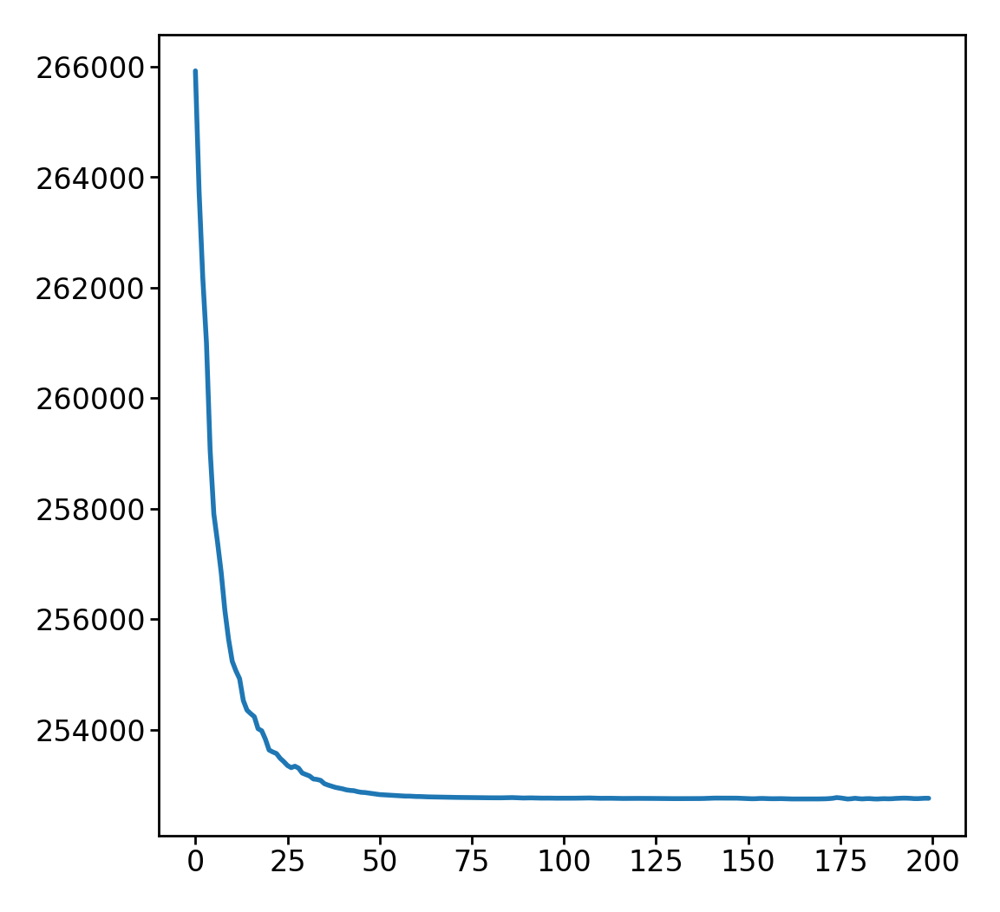

In [29]:
plt.plot(loss)

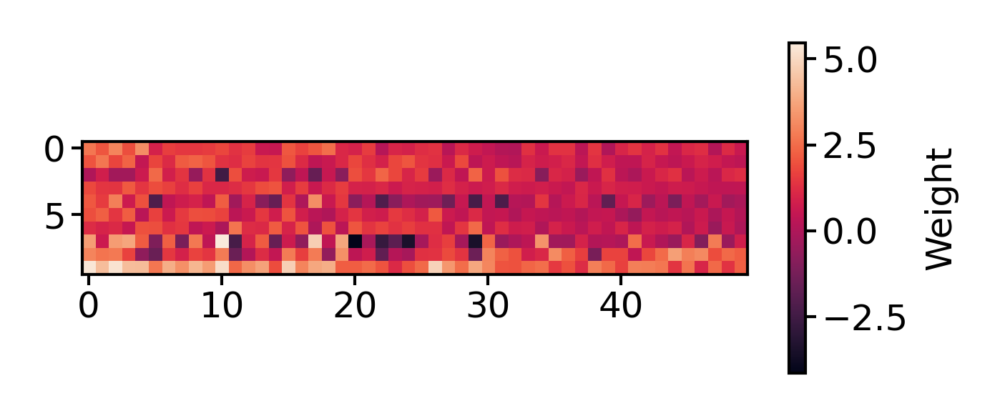

In [30]:
figure(2.5, 1)
plt.imshow(optimized_params['bio_basis_weights'].T)
plt.colorbar(label="Weight")

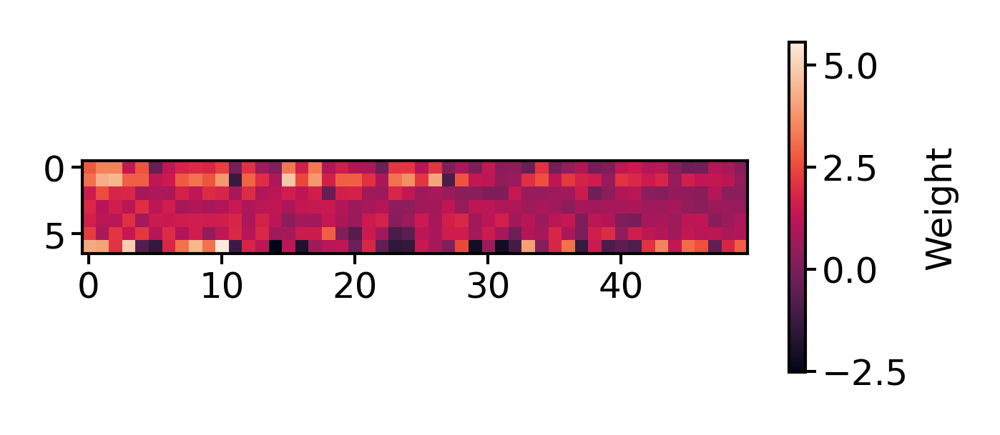

In [31]:
figure(2.5, 1)
plt.imshow(optimized_params['size_basis_weights'].T)
plt.colorbar(label="Weight")

In [34]:
bio_est = optimized_params['bio_basis_weights'] @ basis_dict['bio']
size_est = optimized_params['size_basis_weights'] @ basis_dict['size']

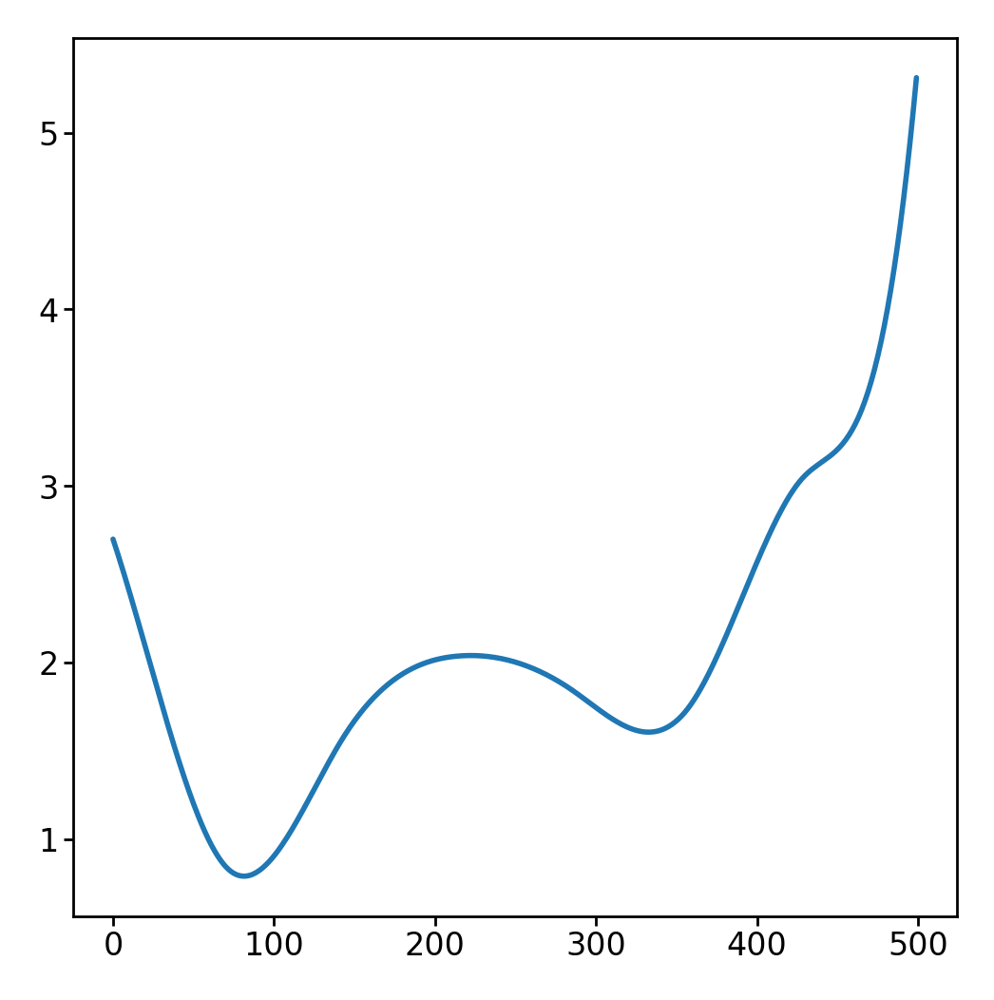

In [35]:
plt.plot(bio_est[0])

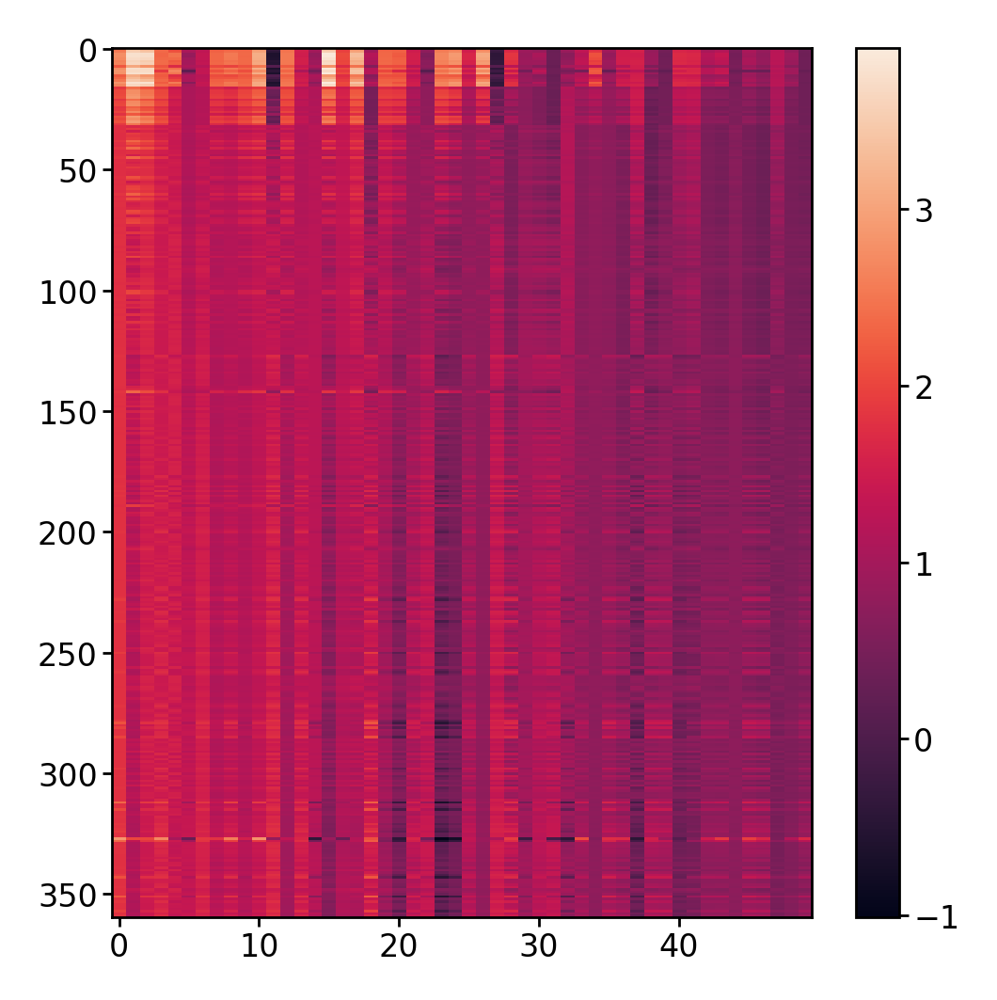

In [36]:
plt.imshow(size_est.T, aspect='auto', interpolation='none')
plt.colorbar()

## Train longtogeny model

In [5]:
df = pd.read_parquet(
    "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_raw_counts_matrix_v00.parquet"
)
df = df.sort_index(axis=1)

n_syllables = 50
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))[:, :n_syllables]

In [6]:
n_splines = 6

age_normalizer, age_unnormalizer = age_normalizer_factory(min_age=-5, max_age=150)
age_samples = np.linspace(0, 1, 1000)
age_sd = age_normalizer(10)
hypparams = {
    "age_sd": age_sd,
    "params_sd": 3.5,
}

spline_class, splines = create_splines(age_samples, df=n_splines)
params = {"basis_weights": jnp.ones((n_syllables, len(splines))) / len(splines)}

ll_fun = partial(
    neg_log_likelihood,
    bases=splines,
    age_samples=age_samples,
    true_age=age_normalizer(age),
    counts=syllable_counts_jax + 1,
    hypparams=hypparams,
)
optimized_params, loss = optimize(params, ll_fun, lr=0.4, n_iter=200)

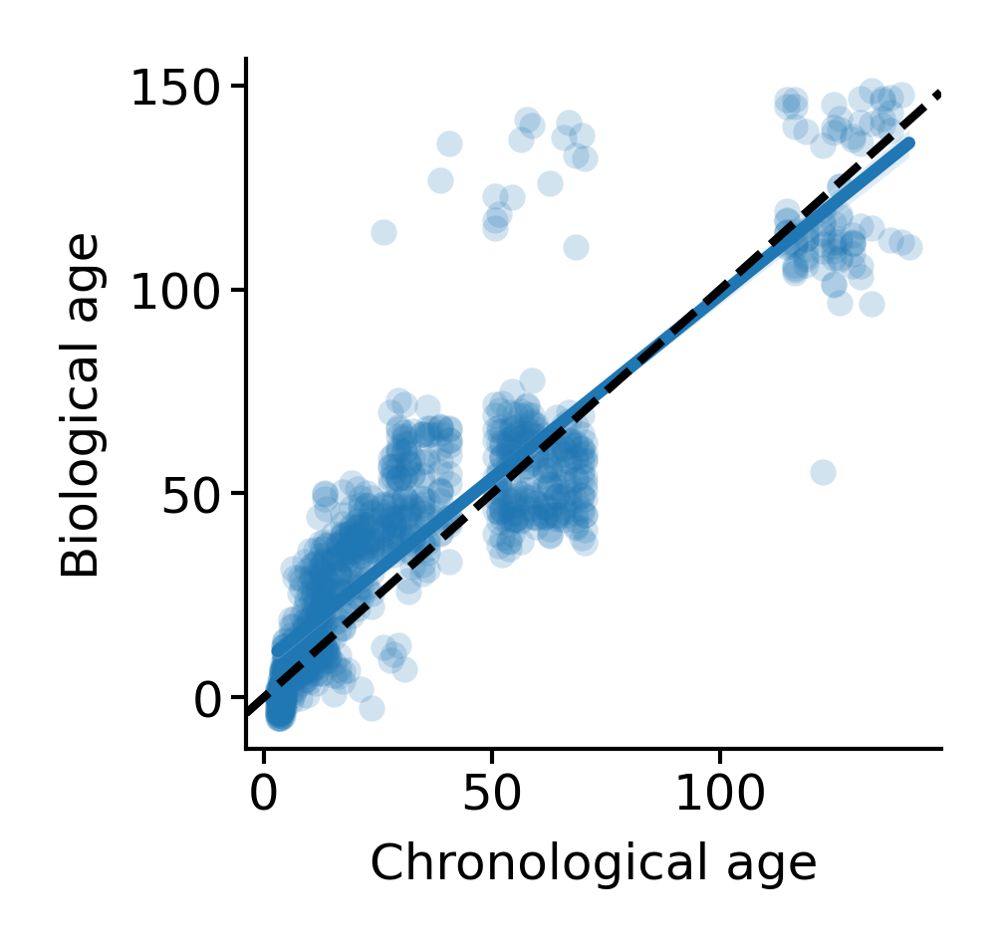

In [7]:
bio_ages = get_biological_age(
    optimized_params,
    splines,
    age_samples,
    age_normalizer(age),
    syllable_counts_jax + 1,
    hypparams,
    age_unnormalizer,
)
figure(1.5, 1.5)
ax = sns.regplot(
    x=age, y=bio_ages, scatter_kws={"alpha": 0.2, "linewidths": 0, "s": 10}
)
ax.set(xlabel="Chronological age", ylabel="Biological age")
add_identity(ax, color="black", ls="--")
sns.despine()

In [8]:
age_df = pd.DataFrame(bio_ages, index=df.index, columns=['bio_age']).reset_index()

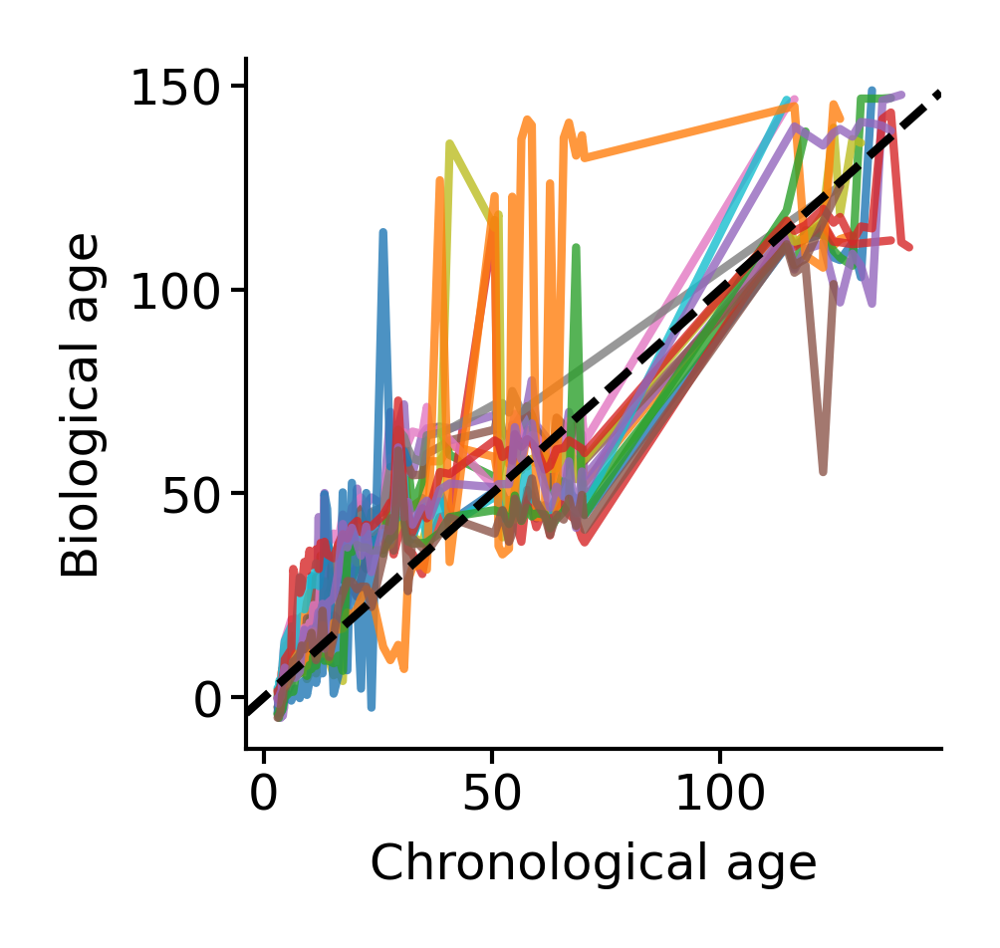

In [9]:
figure(1.5, 1.5)
for mouse, _df in age_df.groupby('mouse'):
    plt.plot(_df['age'], _df['bio_age'], alpha=0.8)
ax = plt.gca()
add_identity(ax, color="black", ls="--")
ax.set(xlabel="Chronological age", ylabel="Biological age")
sns.despine()

In [10]:
for mouse, _df in age_df.groupby('age'):
    age_df.loc[_df.index, 'age_rank'] = _df['bio_age'].rank()

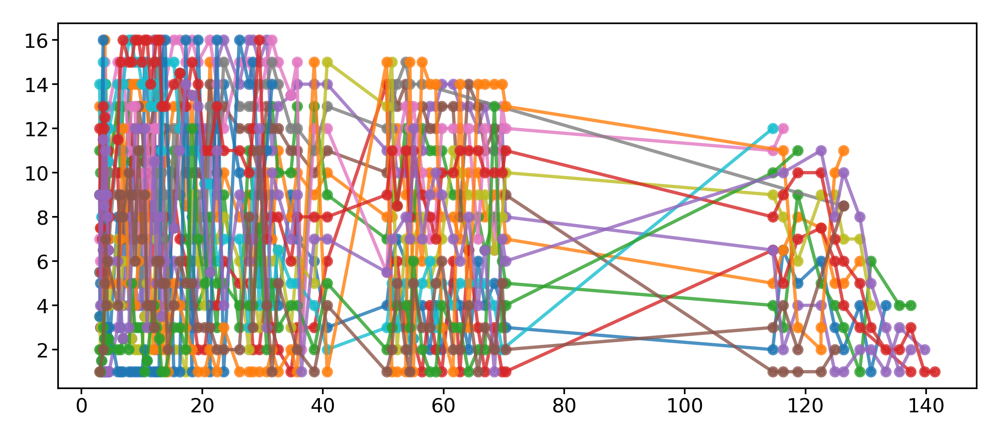

In [11]:
fig = figure(5, 2)
for mouse, _df in age_df.groupby('mouse'):
    plt.plot(_df['age'], _df['age_rank'], '.-', alpha=0.8)

In [12]:
age_index_df = age_df.set_index(['age', 'mouse'])

In [13]:
age_df['age'].unique()

array([  3.       ,   3.142857 ,   3.2857144,   3.4285715,   3.5714285,
         3.7142856,   3.857143 ,   4.       ,   4.142857 ,   4.285714 ,
         4.428571 ,   4.571429 ,   6.       ,   6.428571 ,   6.857143 ,
         7.857143 ,   8.285714 ,   8.857142 ,   9.428572 ,  10.       ,
        10.428572 ,  10.857142 ,  11.428572 ,  12.       ,  12.428572 ,
        12.857142 ,  13.285714 ,  13.857142 ,  14.285714 ,  15.285714 ,
        16.285715 ,  17.285715 ,  18.285715 ,  19.285715 ,  20.428572 ,
        21.285715 ,  22.428572 ,  23.571428 ,  26.142857 ,  27.714285 ,
        28.428572 ,  29.428572 ,  30.714285 ,  31.571428 ,  32.57143  ,
        34.714287 ,  35.714287 ,  36.42857  ,  38.57143  ,  40.714287 ,
        50.57143  ,  51.42857  ,  52.285713 ,  53.714287 ,  54.42857  ,
        55.       ,  56.42857  ,  57.714287 ,  58.714287 ,  59.714287 ,
        61.57143  ,  62.714287 ,  64.14286  ,  65.71429  ,  66.85714  ,
        68.42857  ,  69.71429  ,  70.28571  , 114.57143  , 116.2

In [14]:
ages = age_df['age'].unique()

In [15]:
def align_age(age1, age2):
    x = age_index_df.loc[age1, 'age_rank'].groupby('mouse').mean()
    y = age_index_df.loc[age2, 'age_rank'].groupby('mouse').mean()
    # index = set(x.index).intersection(set(y.index))
    index = x.index.intersection(y.index)
    return x[index], y[index]

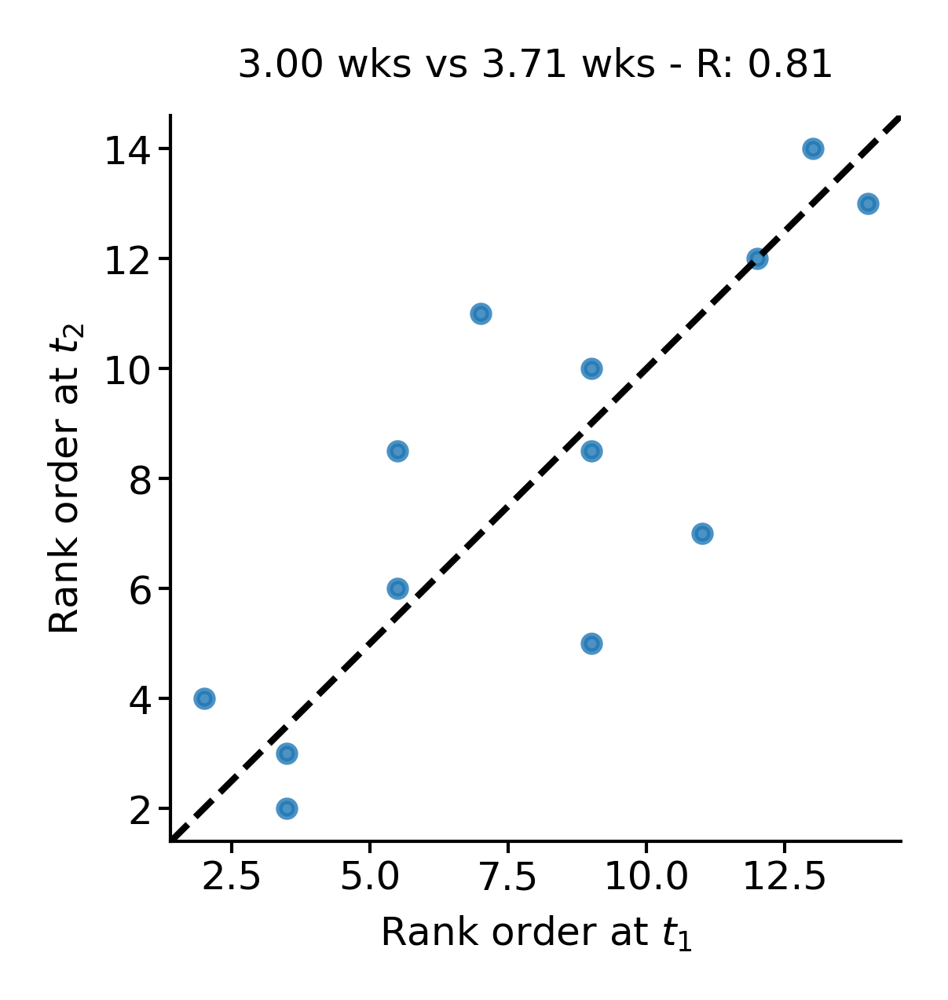

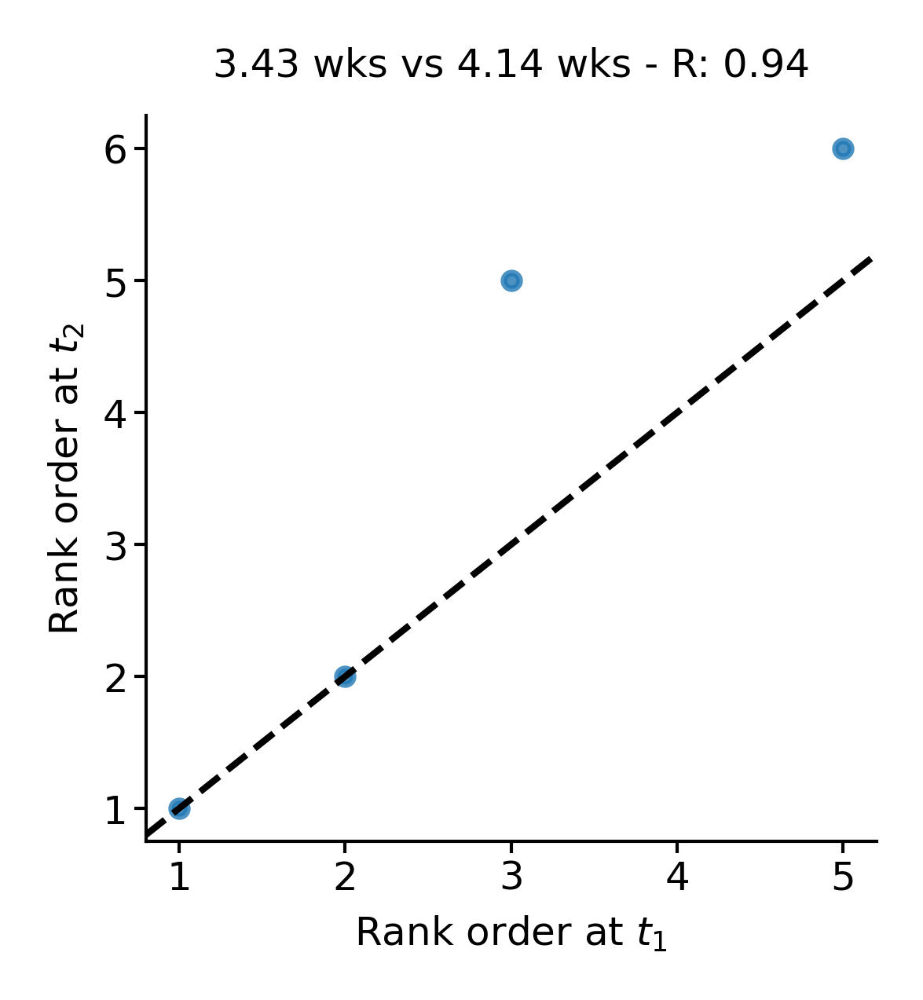

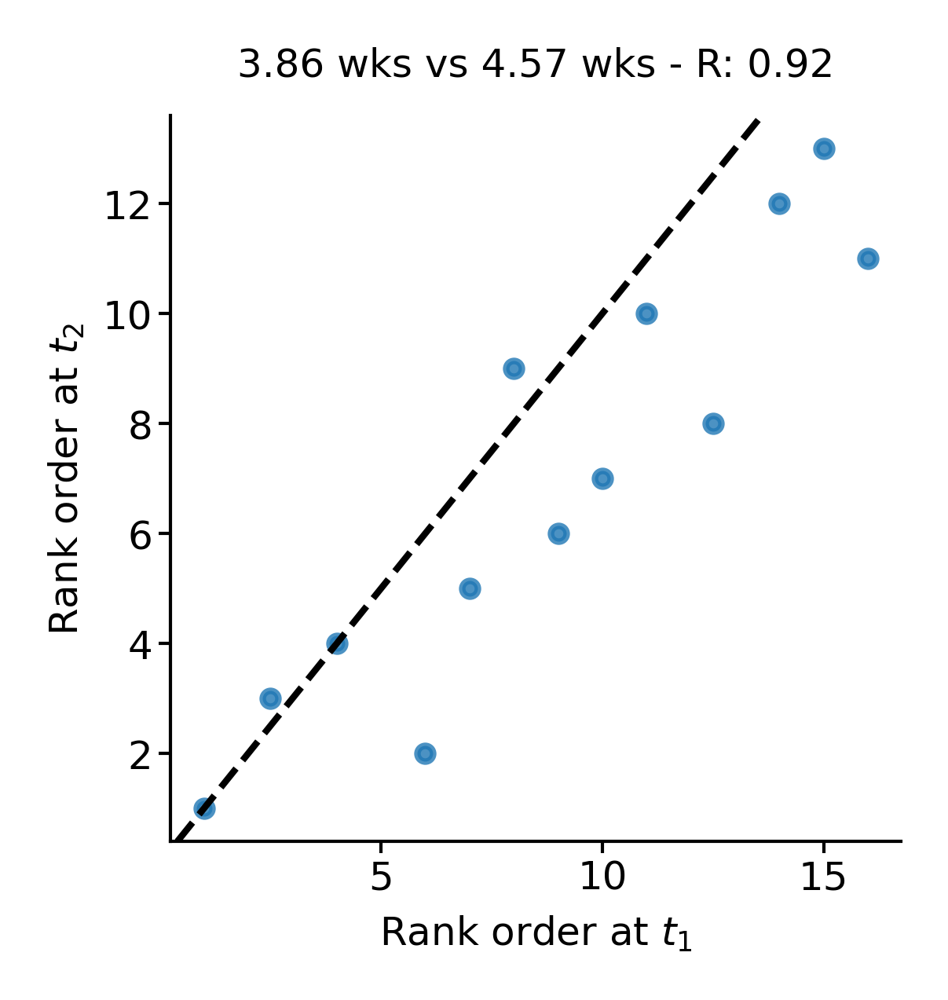

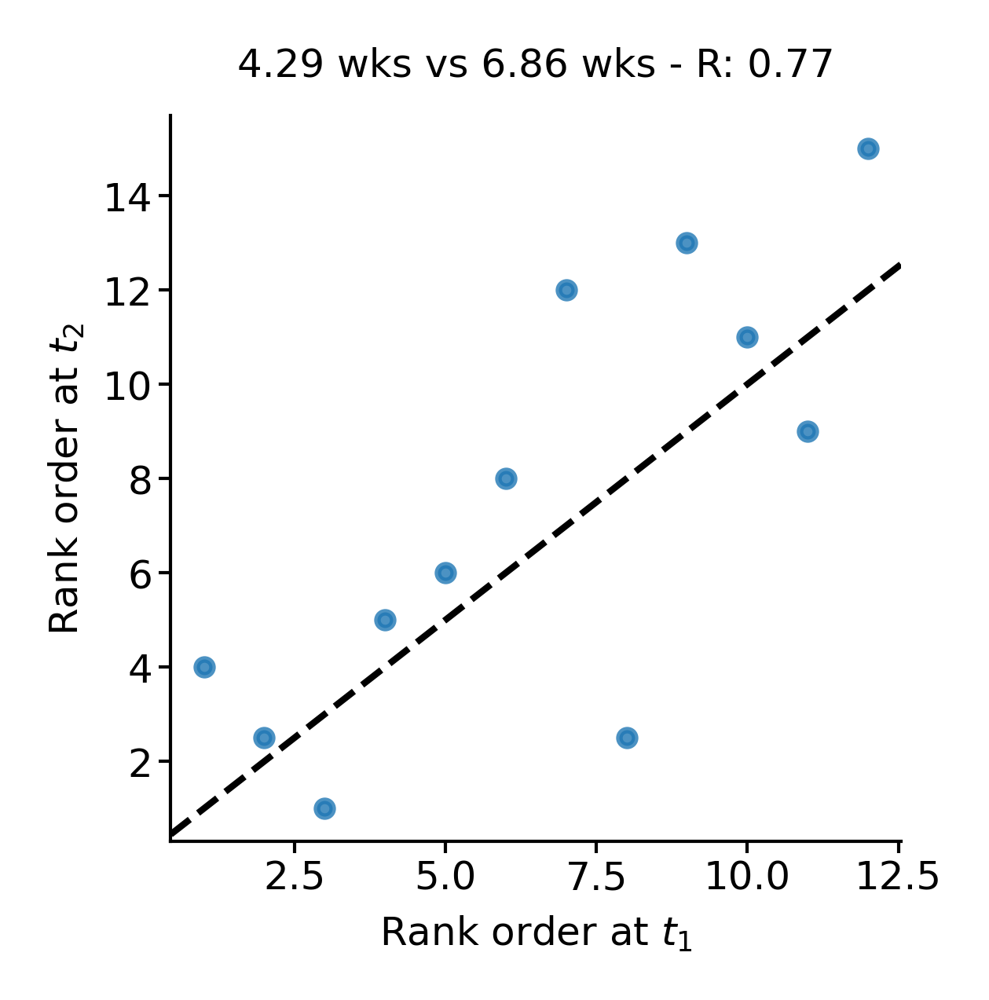

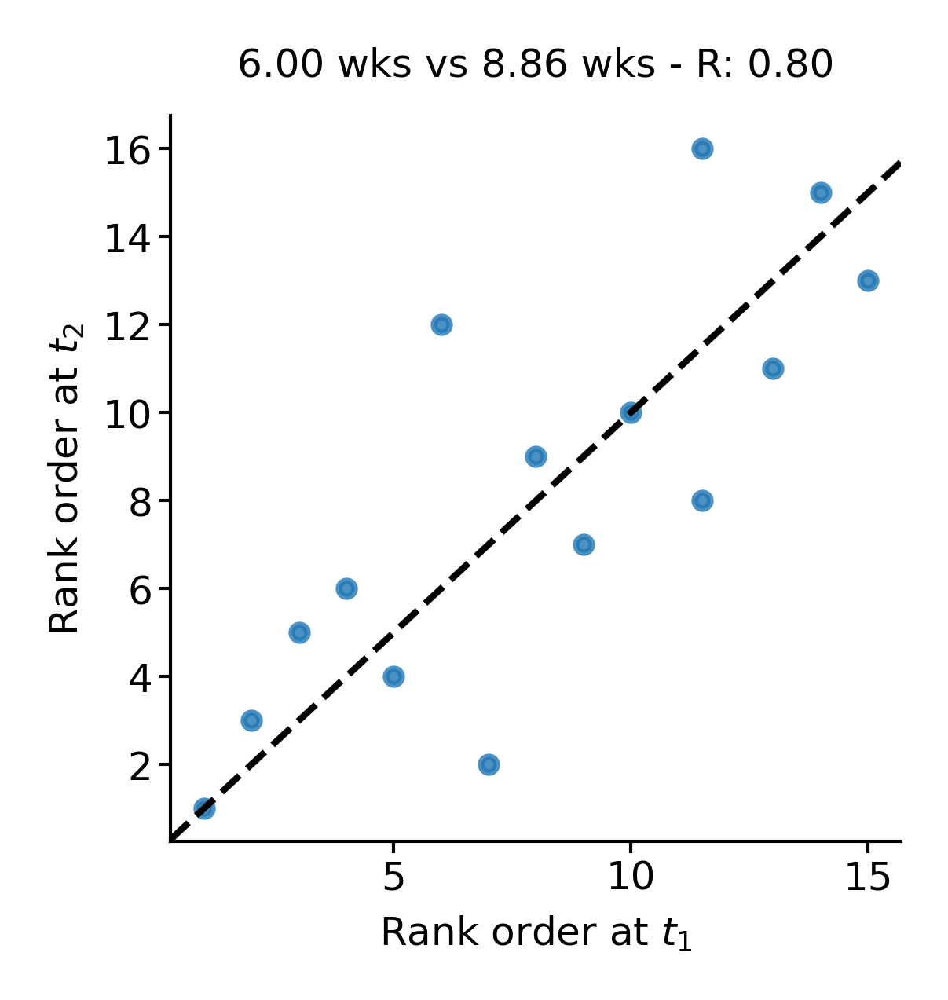

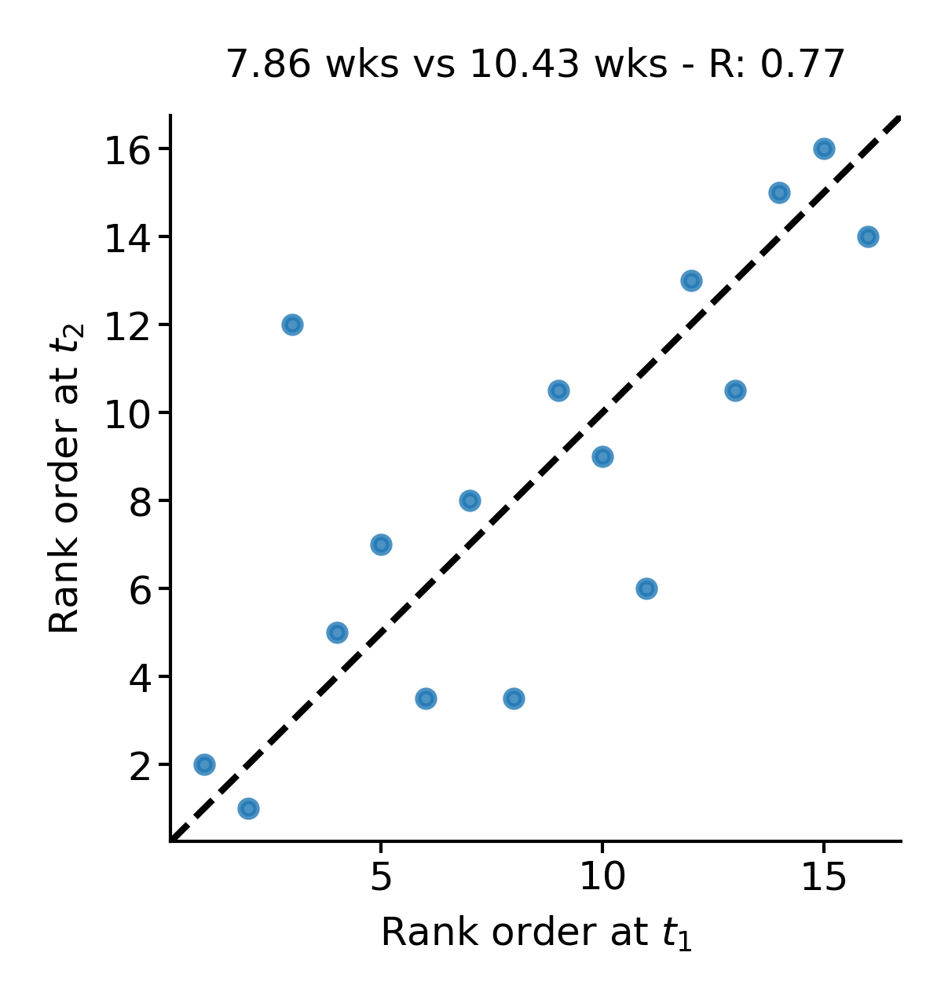

In [19]:
corrs = []
for i, (age1, age2) in enumerate(zip(ages[::3], ages[5::3])):
    x, y = align_age(age1, age2)
    fig = figure(2, 2)
    plt.plot(x, y, '.', alpha=0.8)
    corr = x.corr(y)
    corrs.append(corr)
    plt.title(f"{age1:0.2f} wks vs {age2:0.2f} wks - R: {corr:0.2f}")
    plt.xlabel("Rank order at $t_1$")
    plt.ylabel("Rank order at $t_2$")
    add_identity(plt.gca(), color="black", ls="--")
    sns.despine()
    if i >= 5:
        break

In [24]:
counts_hist = []
avg_diffs = []
for i in range(2, 50):
    corrs = []
    diffs = []
    for age1, age2 in zip(ages, ages[i:]):
        x, y = align_age(age1, age2)
        corr = x.corr(y)
        corrs.append(corr)
        diffs.append(age2 - age1)
    avg_diffs.append(np.median(diffs))
    hist, edge = np.histogram(corrs, bins=np.linspace(-1, 1, 16))
    counts_hist.append(hist)

In [25]:
avg_diffs = np.array(avg_diffs)

[Text(0.5, 0, 'Correlation (R)'), Text(0, 0.5, 'Age difference (weeks)')]

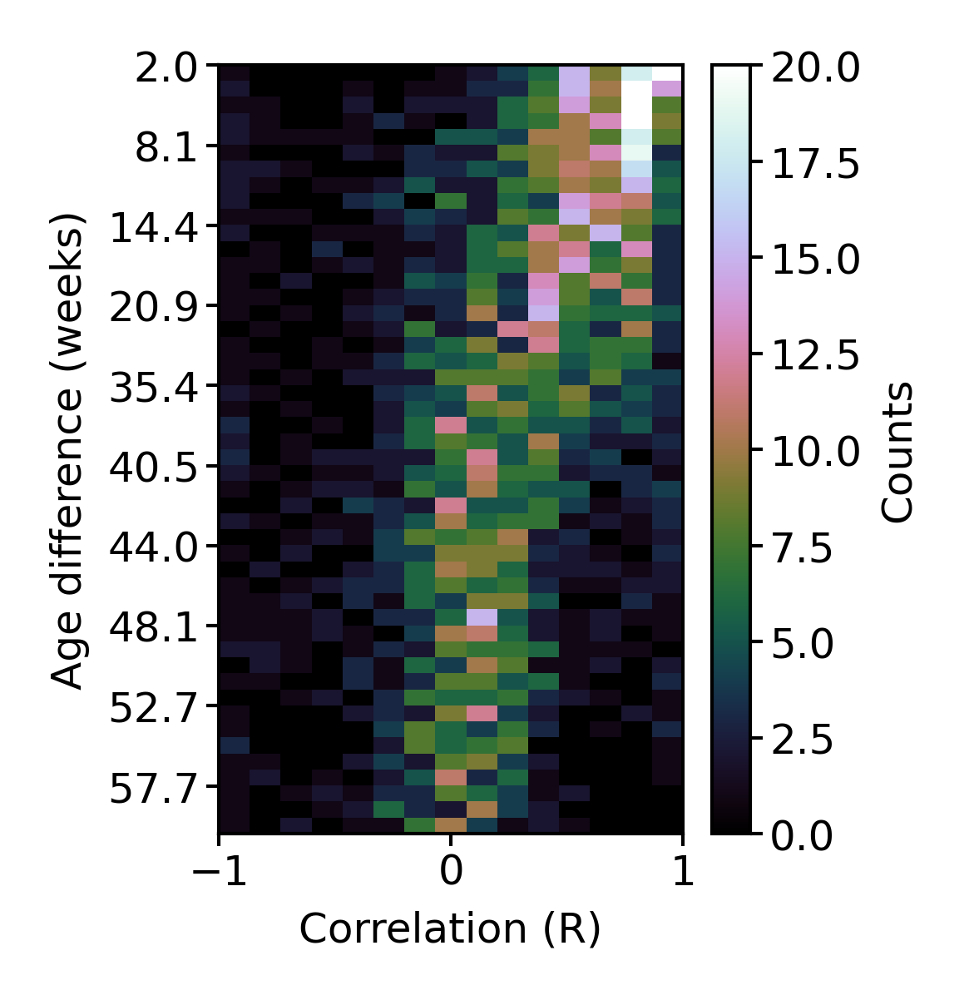

In [26]:
fig = figure(1.5, 2)
ax = fig.gca()
im = ax.imshow(
    counts_hist, extent=(-1, 1, 50, 2), aspect="auto", interpolation="none", vmax=20, cmap='cubehelix'
)
ax.set(yticks=np.arange(2, 50, 5), yticklabels=np.round(avg_diffs[::5], 1))
fig.colorbar(im, label="Counts")
ax.set(xlabel="Correlation (R)", ylabel="Age difference (weeks)")